# Introduction


Diabetes is among the most prevalent chronic diseases in the United States, impacting millions of Americans each year and exerting a significant financial burden on the economy. Diabetes is a serious chronic disease in which individuals lose the ability to effectively regulate levels of glucose in the blood, and can lead to reduced quality of life and life expectancy. After different foods are broken down into sugars during digestion, the sugars are then released into the bloodstream. This signals the pancreas to release insulin. Insulin helps enable cells within the body to use those sugars in the bloodstream for energy. Diabetes is generally characterized by either the body not making enough insulin or being unable to use the insulin that is made as effectively as needed.


Complications like heart disease, vision loss, lower-limb amputation, and kidney disease are associated with chronically high levels of sugar remaining in the bloodstream for those with diabetes. While there is no cure for diabetes, strategies like losing weight, eating healthily, being active, and receiving medical treatments can mitigate the harms of this disease in many patients. Early diagnosis can lead to lifestyle changes and more effective treatment, making predictive models for diabetes risk important tools for public and public health officials.


The scale of this problem is also important to recognize. The Centers for Disease Control and Prevention has indicated that as of 2018, 34.2 million Americans have diabetes and 88 million have prediabetes. Furthermore, the CDC estimates that 1 in 5 diabetics, and roughly 8 in 10 prediabetics are unaware of their risk. While there are different types of diabetes, type II diabetes is the most common form and its prevalence varies by age, education, income, location, race, and other social determinants of health. Much of the burden of the disease falls on those of lower socioeconomic status as well. Diabetes also places a massive burden on the economy, with diagnosed diabetes costs of roughly 327 billion dollars and total costs with undiagnosed diabetes and prediabetes approaching 400 billion dollars annually.

# Content

The Behavioral Risk Factor Surveillance System (BRFSS) is a health-related telephone survey that is collected annually by the CDC. Each year, the survey collects responses from over 400,000 Americans on health-related risk behaviors, chronic health conditions, and the use of preventative services. It has been conducted every year since 1984. For this project, a csv of the dataset available on Kaggle for the year 2015 was used. This original dataset contains responses from 441,455 individuals and has 330 features. These features are either questions directly asked of participants, or calculated variables based on individual participant responses.

1. diabetes_012_health_indicators_BRFSS2015.csv is a clean dataset of 253,680 survey responses to the CDC's BRFSS2015. The target variable Diabetes_012 has 3 classes. 0 is for no diabetes or only during pregnancy, 1 is for prediabetes, and 2 is for diabetes. There is class imbalance in this dataset. This dataset has 21 feature variables

2. diabetes_binary_5050split_health_indicators_BRFSS2015.csv is a clean dataset of 70,692 survey responses to the CDC's BRFSS2015. It has an equal 50-50 split of respondents with no diabetes and with either prediabetes or diabetes. The target variable Diabetes_binary has 2 classes. 0 is for no diabetes, and 1 is for prediabetes or diabetes. This dataset has 21 feature variables and is balanced.

3. diabetes_binary_health_indicators_BRFSS2015.csv is a clean dataset of 253,680 survey responses to the CDC's BRFSS2015. The target variable Diabetes_binary has 2 classes. 0 is for no diabetes, and 1 is for prediabetes or diabetes. This dataset has 21 feature variables and is not balanced.

# Core questions to answer

1. Can survey questions from the BRFSS provide accurate predictions of whether an individual has diabetes?
2. What risk factors are most predictive of diabetes risk?
3. Can we use a subset of the risk factors to accurately predict whether an individual has diabetes?
4. Can we create a short form of questions from the BRFSS using feature selection to accurately predict if someone might have diabetes or is at high risk of diabetes?

source: Alex Teboul - Kaggle

https://www.kaggle.com/datasets/alexteboul/diabetes-health-indicators-dataset

# Goals
As the introduction explained diabetes is one of the most popular risk factor in the USA. It does not only mean risking someone`s life but also it costs a lot for the goverment to cure, dignose and look after the patients.

Since I chose to use the 50/50 dataset, my goal is to create a predictive model that classifies records into [no diabetes, diabetes] categories. This is a binary classification problem. The good news is that the dataframe is already sorted and cleaned, so I only have to test, train and optimize the models.

To answer the core questions I have to carry out an explanatory analysis regarding the models. If everything works out I will be able to confidenetly answer at the end.

# Balanced dataset
As I mentioned before I will use the balanced dataset to create predictive models. This means that roughly 50% of the data are labeled as no diabetes and the rest as diabetes.

This way the model learns how solely the features manipulate patients` result and class distribution has no effect on predictions.

I will use the following type of models:
1. Logistic regression, simplest to implement good for baseline models
2. Distance based models, SVM or KNN
3. Tree based model, Decision Tree, Random Forest, Gradient Boosted Trees

## 1. Importing libraries, loading df, EDA

In [1]:
import plotly.io as pio

pio.renderers.default = "notebook_connected"

In [2]:
# Basics
import pandas as pd # data wrangling
import numpy as np   # for fast array manipulation
import matplotlib.pyplot as plt #visuals
import seaborn as sns #visuals
import math


# Evaluation, scaling for distance based models, splitting
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve
from sklearn.preprocessing import StandardScaler # no need to use since df is already cleaned
from sklearn.model_selection import train_test_split # to create train and test subsets

# Models
from sklearn.linear_model import LogisticRegression      #baseline
from sklearn.svm import SVC # distance base classifier
import xgboost as xgb     # tree based classifier models 

# Optimization library
import optuna

# Save final model
import joblib

### EDA

In [3]:
# Loading balanced dataset
df = pd.read_csv("data/diabetes_binary_5050split_health_indicators_BRFSS2015.csv")
df

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,3.0,5.0,30.0,0.0,1.0,4.0,6.0,8.0
1,0.0,1.0,1.0,1.0,26.0,1.0,1.0,0.0,0.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,1.0,12.0,6.0,8.0
2,0.0,0.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,10.0,0.0,1.0,13.0,6.0,8.0
3,0.0,1.0,1.0,1.0,28.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,3.0,0.0,1.0,11.0,6.0,8.0
4,0.0,0.0,0.0,1.0,29.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,8.0,5.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70687,1.0,0.0,1.0,1.0,37.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,4.0,0.0,0.0,0.0,0.0,6.0,4.0,1.0
70688,1.0,0.0,1.0,1.0,29.0,1.0,0.0,1.0,0.0,1.0,...,1.0,0.0,2.0,0.0,0.0,1.0,1.0,10.0,3.0,6.0
70689,1.0,1.0,1.0,1.0,25.0,0.0,0.0,1.0,0.0,1.0,...,1.0,0.0,5.0,15.0,0.0,1.0,0.0,13.0,6.0,4.0
70690,1.0,1.0,1.0,1.0,18.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,4.0,0.0,0.0,1.0,0.0,11.0,2.0,4.0


In [4]:
df.dtypes

# Since the features represent categories with numbers this mathces the data type.

Diabetes_binary         float64
HighBP                  float64
HighChol                float64
CholCheck               float64
BMI                     float64
Smoker                  float64
Stroke                  float64
HeartDiseaseorAttack    float64
PhysActivity            float64
Fruits                  float64
Veggies                 float64
HvyAlcoholConsump       float64
AnyHealthcare           float64
NoDocbcCost             float64
GenHlth                 float64
MentHlth                float64
PhysHlth                float64
DiffWalk                float64
Sex                     float64
Age                     float64
Education               float64
Income                  float64
dtype: object

### Description of the features
- Diabetes binary: 0 = no diabetes 1 = prediabetes 2 = diabetes
- HighBP: 0 = no high BP 1 = high BP
- HighChol: 0 = no high cholesterol 1 = high cholesterol
- CholCheck: 0 = no cholesterol check in 5 years 1 = yes cholesterol check in 5 years
- BMI: Body Mass Index
- Smoker: Have you smoked at least 100 cigarettes in your entire life? [Note: 5 packs = 100 cigarettes] 0 = no 1 = yes
- Stroke: (Ever told) you had a stroke. 0 = no 1 = yes
- HeartDiseaseorAttack: coronary heart disease (CHD) or myocardial infarction (MI) 0 = no 1 = yes
- PhysActivity: physical activity in past 30 days - not including job 0 = no 1 = yes
- Fruits: Consume Fruit 1 or more times per day 0 = no 1 = yes
- Veggies: Consume Vegetables 1 or more times per day 0 = no 1 = yes
- HvyAlcoholConsump: (adult men >=14 drinks per week and adult women>=7 drinks per week) 0 = no 1 = yes
- AnyHealthcare: Have any kind of health care coverage, including health insurance, prepaid plans such as HMO, etc. 0 = no 1 = yes
- NoDocbcCost: Was there a time in the past 12 months when you needed to see a doctor but could not because of cost? 0 = no 1 = yes
- GenHlth: Would you say that in general your health is: scale 1-5 1 = excellent 2 = very good 3 = good 4 = fair 5 = poor
- MentHlth: days of poor mental health scale 1-30 days
- PhysHlth: physical illness or injury days in past 30 days scale 1-30
- DiffWalk: Do you have serious difficulty walking or climbing stairs? 0 = no 1 = yes
- Sex: 0 = female 1 = male
- Age: 13-level age category (_AGEG5YR see codebook) 1 = 18-24 9 = 60-64 13 = 80 or older
- Education level: (EDUCA see codebook) scale 1-6 1 = Never attended school or only kindergarten 2 = elementary etc.
- Income scale: (INCOME2 see codebook) scale 1-8 1 = less than $10,000 5 = less than $35,000 8 = $75,000 or more

In [5]:
df.shape

# I can see 70k records with 21 predictive features and 1 target variable which is the diabetes type.

(70692, 22)

In [6]:
# Basic statistics about the dataframe
# I do not see any flaws or outliers, only right skewness in BMI
df.describe()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
count,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,...,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000,70692.000000
mean,0.500000,0.563458,0.525703,0.975259,29.856985,0.475273,0.062171,0.147810,0.703036,0.611795,...,0.954960,0.093914,2.837082,3.752037,5.810417,0.252730,0.456997,8.584055,4.920953,5.698311
std,0.500004,0.495960,0.499342,0.155336,7.113954,0.499392,0.241468,0.354914,0.456924,0.487345,...,0.207394,0.291712,1.113565,8.155627,10.062261,0.434581,0.498151,2.852153,1.029081,2.175196
min,0.000000,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,1.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,7.000000,4.000000,4.000000
50%,0.500000,1.000000,1.000000,1.000000,29.000000,0.000000,0.000000,0.000000,1.000000,1.000000,...,1.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,9.000000,5.000000,6.000000
75%,1.000000,1.000000,1.000000,1.000000,33.000000,1.000000,0.000000,0.000000,1.000000,1.000000,...,1.000000,0.000000,4.000000,2.000000,6.000000,1.000000,1.000000,11.000000,6.000000,8.000000
max,1.000000,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,5.000000,30.000000,30.000000,1.000000,1.000000,13.000000,6.000000,8.000000


In [7]:
# The dataframe does not have any missing value, which speeds up the process
df.isna().sum().sum()

np.int64(0)

In [8]:
"""
This shows me that there are multiple duplicates in the record, however in the introduction it was stated that every record is from
a unique person so removing is not wise to do. I will keep "duplicates" since they are from different people. (A unique identifier 
could have helped to solve this
"""

# mask for duplicates
duplicate_mask = df.duplicated(keep=False)

# filter on mask
df[duplicate_mask]

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
4,0.0,0.0,0.0,1.0,29.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,8.0,5.0,8.0
12,0.0,1.0,1.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,1.0,7.0,6.0,8.0
20,0.0,0.0,0.0,1.0,22.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,6.0,6.0,8.0
58,0.0,0.0,0.0,1.0,23.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,6.0,6.0,8.0
86,0.0,0.0,0.0,1.0,33.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,4.0,6.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69865,1.0,1.0,1.0,1.0,27.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,4.0,0.0,0.0,0.0,1.0,12.0,6.0,8.0
69939,1.0,1.0,1.0,1.0,27.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,1.0,12.0,6.0,8.0
70305,1.0,1.0,0.0,1.0,30.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,3.0,0.0,0.0,0.0,1.0,9.0,4.0,7.0
70591,1.0,1.0,1.0,1.0,30.0,0.0,0.0,1.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,1.0,10.0,6.0,8.0


#### I. Distribution plot of target variable

Text(0.5, 1.0, 'Target variable distribution')

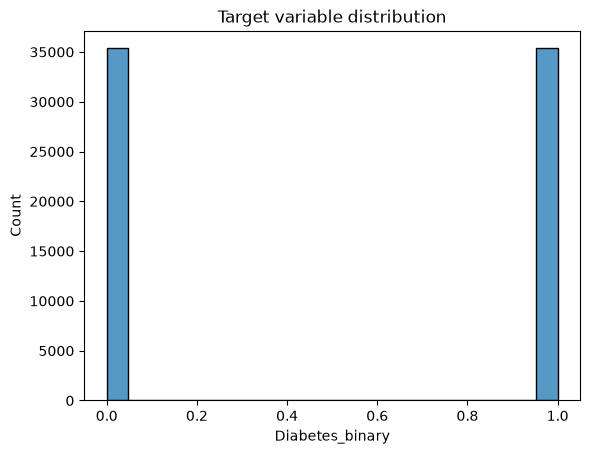

In [9]:
sns.histplot(df["Diabetes_binary"])
plt.title("Target variable distribution")

# Perfectly visible that it is a balanced dist. between two classes

In [10]:
df["Diabetes_binary"].value_counts()
# This hardens the observation from the above plot. The two classes are perfectly symetrical. (This does not mirror reality)

Diabetes_binary
0.0    35346
1.0    35346
Name: count, dtype: int64

#### II. Distribution plot across features

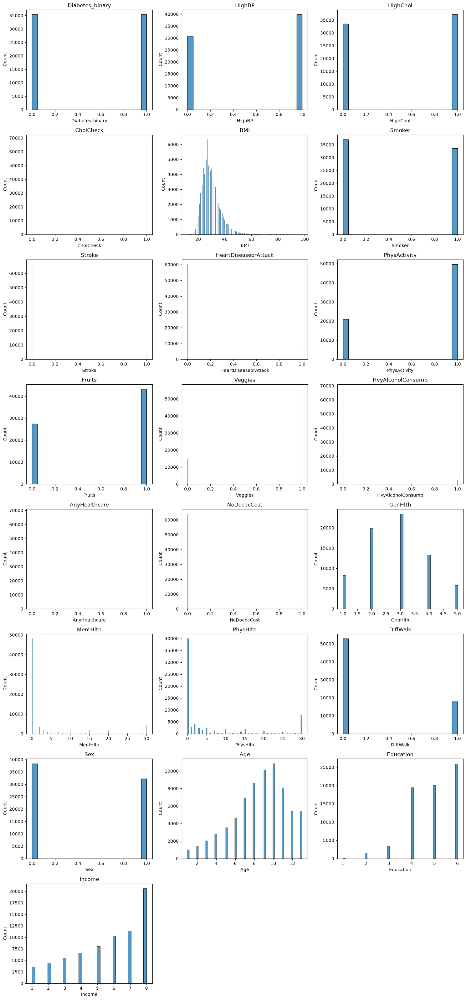

In [11]:
# how many rows
num_cols = len(df.columns)
grid_rows = math.ceil(num_cols / 3)

# create grid
fig, axes = plt.subplots(nrows=grid_rows, ncols=3, figsize=(15, 4 * grid_rows))
axes = axes.flatten()

# loop through columns
for index, col_name in enumerate(df.columns):
    sns.histplot(df[col_name], ax=axes[index])
    axes[index].set_title(col_name)

# hide the rest of the charts
for extra in range(num_cols, len(axes)):
    fig.delaxes(axes[extra])

plt.tight_layout() 
plt.show()

The distributions look aligned and proper. Some are bivariate, some represent a normal distribution curve. However BMI looks skewed.

#### III. Correaltion plot

<Axes: >

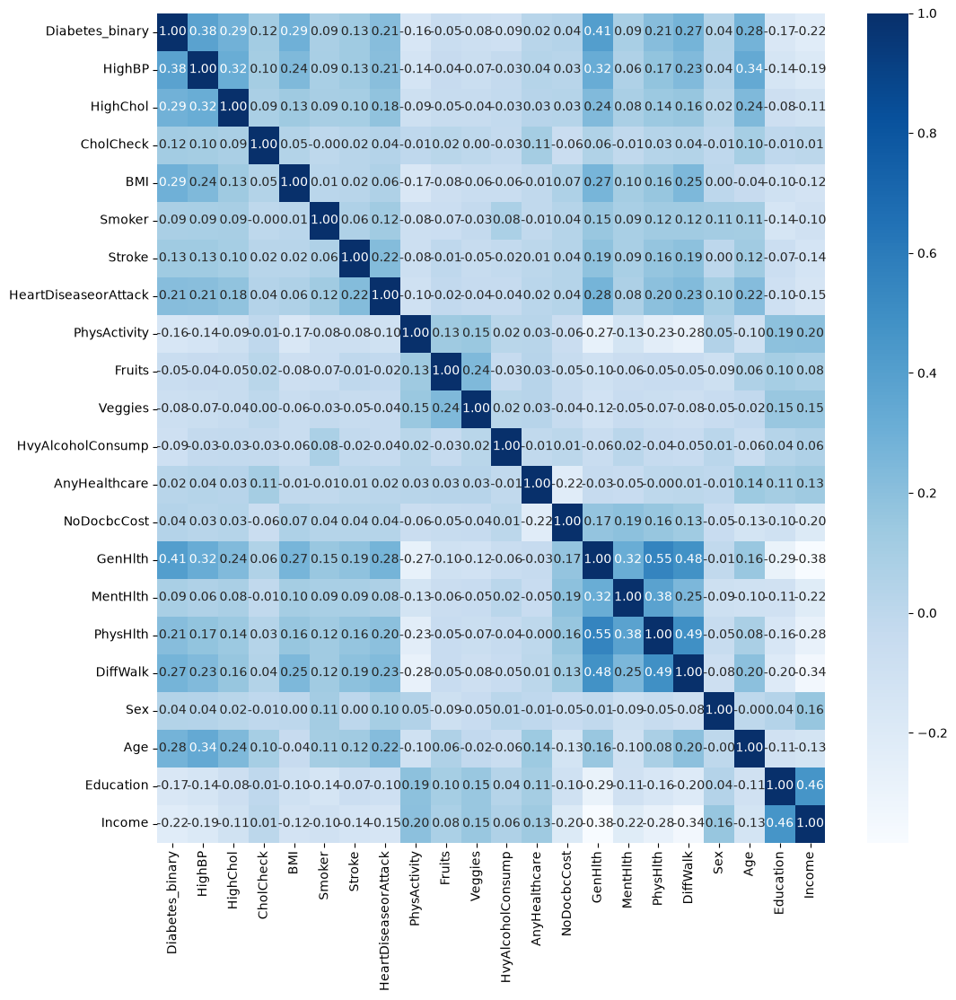

In [12]:
plt.figure(figsize=[12,12])
sns.heatmap(df.corr(), annot=True, fmt=".2f", cmap="Blues")

A good note is that there is no strong correlation between features, this elinimates the risk of multicolinearity, redundancy and data leakage onto the the target variable. Absolute values higher than 0.9 are strong sign that this problem exists.

The highest absolute correlation regarding the targer variable is with General Health. They have a positive correlation of 0.41, this means that there are cases where GenHlth and Diabetes move together. However it is not causation. I can not say that if someone`s General health is below average than the risk of diabetes increases by 41%. It a factor that states the strength of how the two variables move together. 

- Close to 1 -> they move highly together, in the same direction.
- Close to -1 -> they move highly together, but opposite direction.

## 2. Splitting, Training, Showcasing results

#### Insights
After going through the first step it is clearly visible that this dataframe ready for training. In the dataframe at this point:
- There is no missing values, NaN
- No mulicolinearity, super high correlation, redundancy.
- No outliers
- No significant duplicates
- Risk of GenHlth and PhysHlth redundant? Correlation 0.55 which is not risky to keep. GenHlth explains the overall health of a person, while
the PhysHlth looks at the injuries in the past 30 days. They are two different categories. 
An example for redundany would be height measured in centimetres and in inches.

Now, my goal is to build a model that maximizes the accuracy when it classifies the classes. I choose accuracy since the classes are perfectly balanced. No weight needed.

In [13]:
# splitting into features and target variable
# I do this here, but if I had to do data manipulation and standardization then I have to split the data before any of those processes
#  to avoid data leakage

x = df.drop(columns=["Diabetes_binary"])
y = df["Diabetes_binary"].copy()

In [14]:
# Train test split
x_train, x_test, y_train, y_test = train_test_split(x,y, stratify=y, test_size=0.3, random_state=11)

#### Logistic regression

In [15]:
lr = LogisticRegression(max_iter=2000, random_state=11) # i used 2000 to overcome convergance warning.
lr.fit(x_train, y_train) # fitting the model

# creating predictions
y_pred = lr.predict(x_test)
sample_pred_lr = lr.predict(x_train)
y_pred_prob = lr.predict_proba(x_test)[:,1]

In [16]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.77      0.73      0.75     10604
         1.0       0.74      0.78      0.76     10604

    accuracy                           0.75     21208
   macro avg       0.75      0.75      0.75     21208
weighted avg       0.75      0.75      0.75     21208



Not bad results for a baseline model.

- Precision: When a model predicts 100 0s I expect that around 77% of the predictions will be correct, 74% for class 1.

- Recall: How much % did each class got predicted. That is, out of all class 0s 73% got identified, 78% for class 1.

It is possible to tune the model with precision-recall tradeoff to find the sweet spot if identifying classes have different costs.

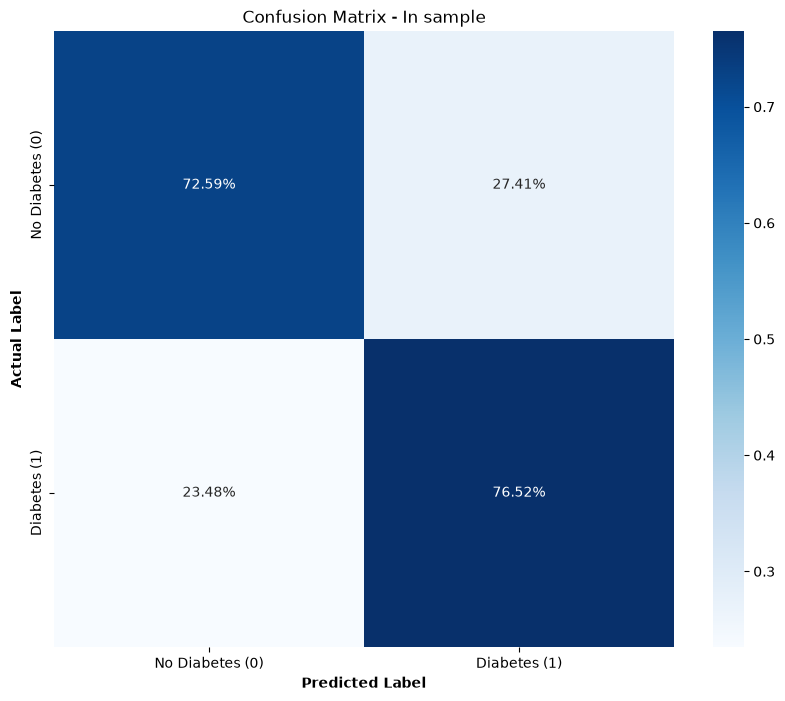

In [17]:
my_classes = ["No Diabetes (0)", "Diabetes (1)"]

plt.figure(figsize=[10,8])
sns.heatmap(confusion_matrix(y_train, sample_pred_lr, normalize="true"), 
            annot=True, 
            cmap="Blues", 
            fmt=".2%",
            xticklabels=my_classes, 
            yticklabels=my_classes) 


plt.xlabel("Predicted Label", fontweight='bold')
plt.ylabel("Actual Label", fontweight='bold')
plt.title("Confusion Matrix - In sample")

plt.show()

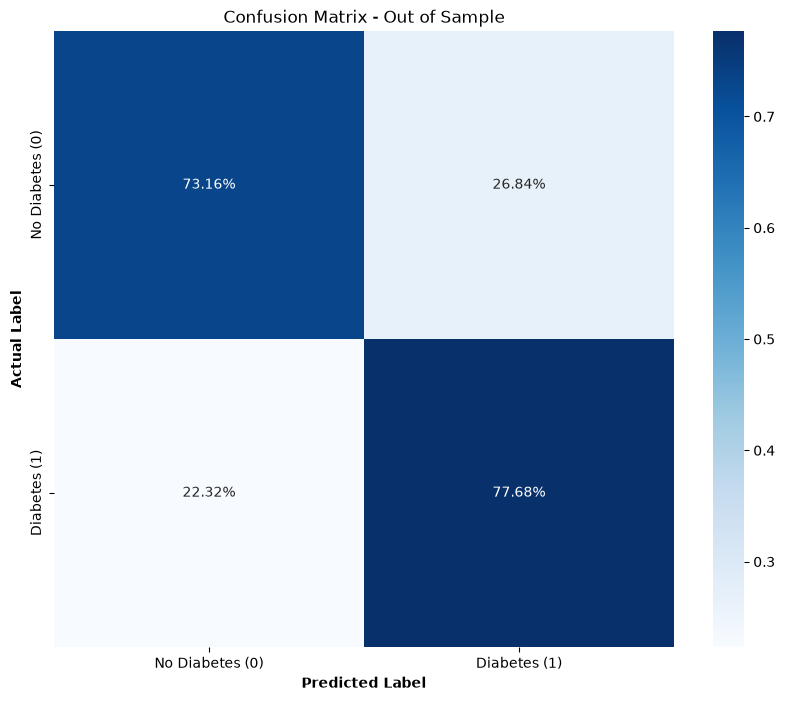

In [18]:
plt.figure(figsize=[10,8])
sns.heatmap(confusion_matrix(y_test, y_pred, normalize="true"), 
            annot=True, 
            cmap="Blues", 
            fmt=".2%",
            xticklabels=my_classes, 
            yticklabels=my_classes) 


plt.xlabel("Predicted Label", fontweight='bold')
plt.ylabel("Actual Label", fontweight='bold')
plt.title("Confusion Matrix - Out of Sample")

plt.show()

#### Area Under The Curve

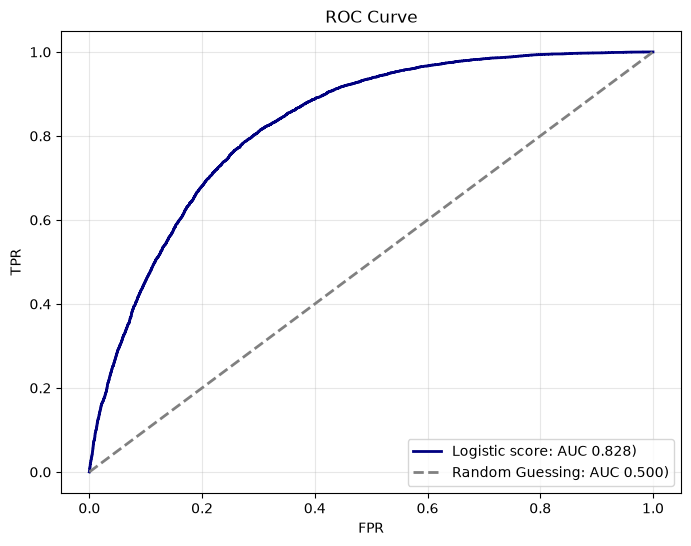

In [19]:
auc_score_lg = roc_auc_score(y_test, y_pred_prob)
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

plt.figure(figsize=(8, 6))

# draw roc curve
plt.plot(fpr, tpr, color='navy', lw=2, label=f'Logistic score: AUC {auc_score_lg:.3f})')

# draw pure randomness line
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--', label='Random Guessing: AUC 0.500)')


plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

This is the precision-recall trade off chart. It look well-bent. The dashed gray line represents the randomness, like if I were to predict patients, or assigning every patient as 0s. However this does not work effectively. That is why I used a model to predict outcomes based on rules. And as I can see it outperformed pure randomness. The better the model the more the blue curve is to the North-West corner.

#### SVC

Removed from the training and optimization list since it takes minutes to even fit one iteration. Using this during optimization process where I do 1000 iterations will take hours.

In [20]:
#svc = SVC()
#svc.fit(x_train, y_train)

# it took way long to fit, so in the real world this would not work as a deployable model

In [21]:
#y_pred_svc = svc.predict(x_test)
#sample_pred_svc = svc.predict(x_train)

In [22]:
#sns.heatmap(confusion_matrix(y_test, y_pred_svc, normalize="true"), 
    #        annot=True, 
   #         cmap="Blues", 
  #          fmt=".2%",
 #           xticklabels=my_classes, 
#            yticklabels=my_classes) 


#plt.xlabel("Predicted Label", fontweight='bold')
#plt.ylabel("Actual Label", fontweight='bold')
#plt.title("Confusion Matrix")

#plt.show()

In [23]:
#print(classification_report(y_test, y_pred_svc))

#### XGB

In [24]:
model_x = xgb.XGBClassifier()
model_x.fit(x_train, y_train)

y_pred_xgb = model_x.predict(x_test)
sample_pred_xgb = model_x.predict(x_train)
y_prob_xgb = model_x.predict_proba(x_test)[:,1]

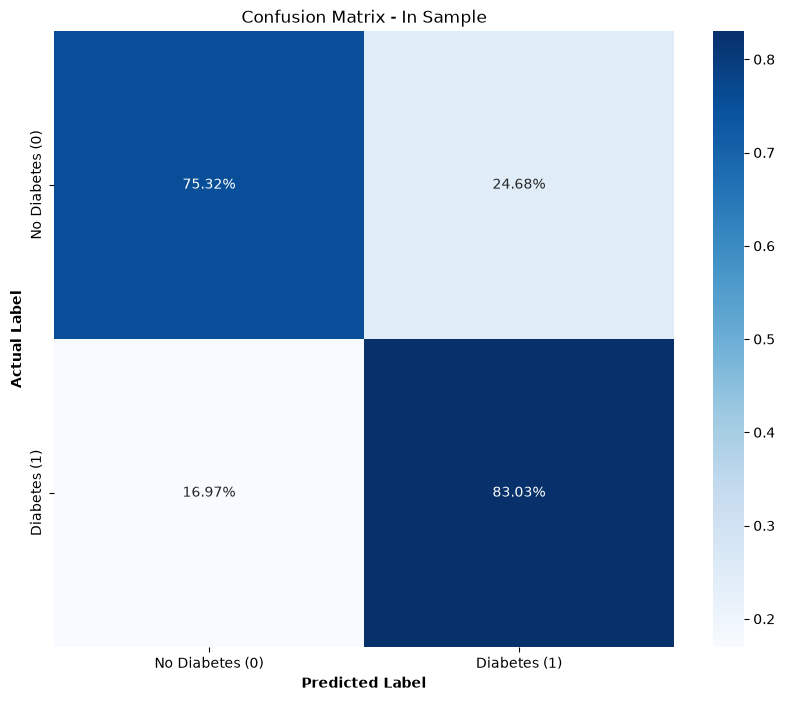

In [25]:
plt.figure(figsize=[10,8])
sns.heatmap(confusion_matrix(y_train, sample_pred_xgb, normalize="true"), 
            annot=True, 
            cmap="Blues", 
            fmt=".2%",
            xticklabels=my_classes, 
            yticklabels=my_classes) 


plt.xlabel("Predicted Label", fontweight='bold')
plt.ylabel("Actual Label", fontweight='bold')
plt.title("Confusion Matrix - In Sample")

plt.show()

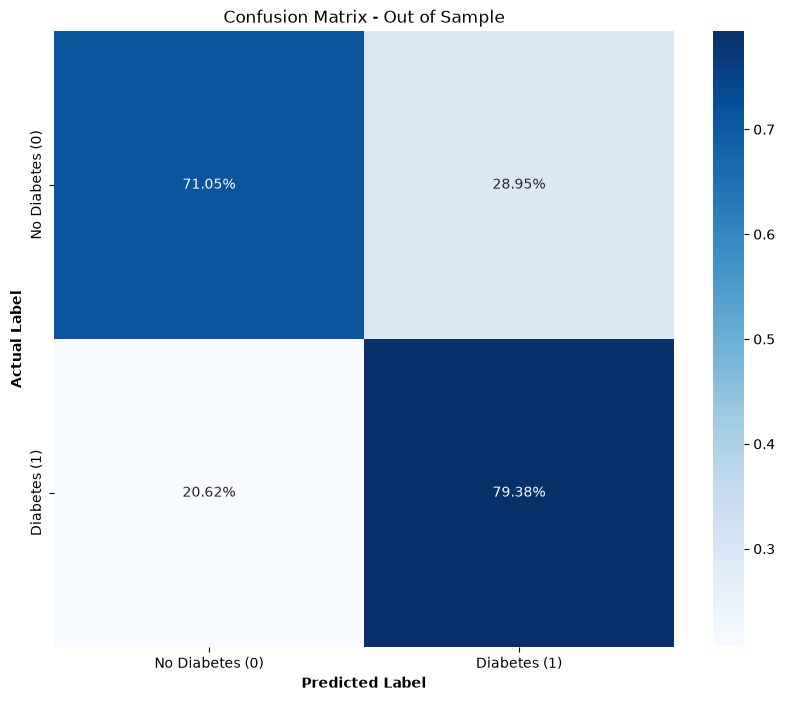

In [26]:
plt.figure(figsize=[10,8])
sns.heatmap(confusion_matrix(y_test, y_pred_xgb, normalize="true"), 
            annot=True, 
            cmap="Blues", 
            fmt=".2%",
            xticklabels=my_classes, 
            yticklabels=my_classes) 


plt.xlabel("Predicted Label", fontweight='bold')
plt.ylabel("Actual Label", fontweight='bold')
plt.title("Confusion Matrix - Out of Sample")

plt.show()

#### Area Under The Curve

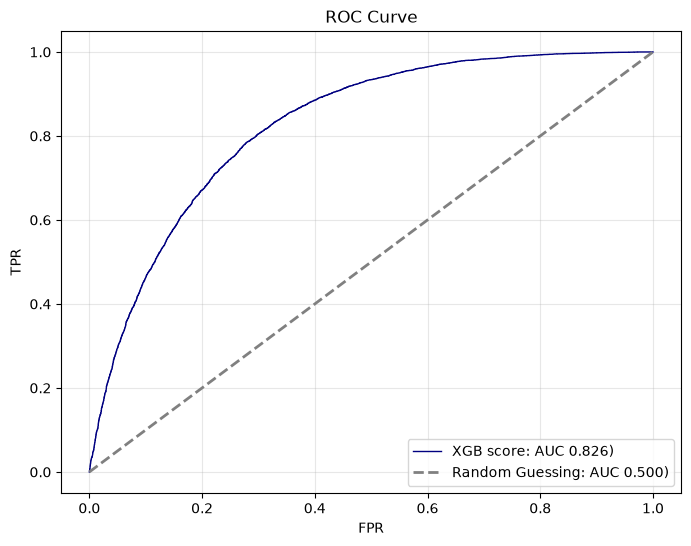

In [27]:
auc_score_xgb = roc_auc_score(y_test, y_prob_xgb)
fpr1, tpr1, thresholds1 = roc_curve(y_test, y_prob_xgb)

plt.figure(figsize=(8, 6))

# draw roc curve
plt.plot(fpr1, tpr1, color='navy', lw=1, label=f'XGB score: AUC {auc_score_xgb:.3f})') #xgb

# draw pure randomness line
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--', label='Random Guessing: AUC 0.500)')


plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

## 3.  Optimization
While the models achieved good results, it is rarely the case that the best performance is achieved by using the factory set parameters. This is why I will use an optimization library called Optuna to try to find the best parameters for this task.

There are multiple ways to optimize:
1. Brute force every possbile combination inside the grid -> gives the best combination, but in a large grid it is absurdly slow
2. Random sampling from the grid. While this is better, it can miss out on exciting regions.
3. Adaptive, like optuna. This method tries multiple combinations then looks at the result and tries to find interesting areas where the global optimum could rest.

I will not optimize SVC as it took very long time to even fit it in the first place. So I will optimize Logistic regression and XGBClassifier.

In [28]:
import optuna
from optuna.visualization import plot_optimization_history, plot_slice, plot_parallel_coordinate, plot_param_importances, plot_contour
from plotly.io import show

### Logistic regression optimization

#### The optimization system
First I create a study named "study_lr" specifically for optimizing Logistic Regression. I also will create a specific database so I can store the optimization results and if I ever want to continue optimizing the same model. And of course I want to maximize the objective value which is the accuracy.

In [29]:
import optuna


study_lr = optuna.create_study(
    study_name="logis_v1",  
    storage="sqlite:///my_models.db",  
    direction="maximize",              
    load_if_exists=True                
)

[I 2026-09-16 16:26:00,203] Using an existing study with name 'logis_v1' instead of creating a new one.


Then I create the grid where optuna will search the hyperparameters, for every combination it will fit the model, predict, evaluate and save the results to the database.

In [30]:
def objective_lr(trial):
    # first the model chooses a solver
    solver = trial.suggest_categorical('solver', ['lbfgs', 'liblinear', 'saga'])
    
    # because solvers require different regulaziation sets I created the logical gates
    if solver == 'lbfgs':
        reg_type = trial.suggest_categorical('reg_lbfgs', ['l2', 'none'])
    elif solver == 'liblinear':
        reg_type = trial.suggest_categorical('reg_liblinear', ['l1', 'l2'])
    elif solver == 'saga':
        reg_type = trial.suggest_categorical('reg_saga', ['l1', 'l2', 'elasticnet', 'none'])
        
    # basic hyperparameters, independent of solver
    C = trial.suggest_float('C', 1e-4, 1e2, log=True)
    l1_ratio = 0.0 
    
    # scikit learn requires logic change
    if reg_type == 'none':
        C = np.inf      
    elif reg_type == 'l2':
        l1_ratio = 0.0  
    elif reg_type == 'l1':
        l1_ratio = 1.0  
    elif reg_type == 'elasticnet':
        l1_ratio = trial.suggest_float('l1_ratio_val', 0.01, 0.99)
        
    # build the model from hyperparameters that was recommended by optuna
    model = LogisticRegression(
        solver=solver,
        C=C,
        l1_ratio=l1_ratio,
        max_iter=1000,
        random_state=11
    )
    
    # trainn model, predict, evaulate
    model.fit(x_train, y_train)
    preds = model.predict(x_test)
    
    return accuracy_score(y_test, preds)

Then run the optimization. I used my Mac Mini for this process as it is way faster than my laptop. I gained 5x efficiency this way. Then I saved the results to the database and exported to my laptop.
All in all I did around 500 iterations which is enough to find hyperparameter settings that fits better for the dataset. To explore how the optimization performed I look at the in-built visuals of Optuna.

In [31]:
study_lr.optimize(objective_lr, n_trials=1, n_jobs=-1)

[I 2026-09-16 16:26:14,076] Trial 560 finished with value: 0.7551395699735949 and parameters: {'solver': 'saga', 'reg_saga': 'l2', 'C': 0.0035846612265772824}. Best is trial 152 with value: 0.7553753300641267.


#### Visuals

From optimization histroy plot I can see that the model did not really gain a significant improvement. The first iterations were at 0.754 while the best resulted in a value of 0.755. This means that the Logistic Regression model with the factory hyperparameters could find a border that splits the two classes accurately. Optimization only improved slightly.

In [32]:
plot_optimization_history(study_lr)

According to Optuna, the most important hyperparameters were C and the solver engine. This means that they are responsible for most of the variance when the dials were tweaked. For example a high C value could result in 0.74 accuracy while the best C value resulted in 0.755. This huge variance was implied by C. The same is true for the solver but with less effect.  The rest of the hyperparameters are insignificant, even changing them did not really move the final accuracy anywhere.

In [33]:
plot_param_importances(study_lr)

Slice plot shows how different values for hyperparameters influenced the accuracy. The color indicates which attempt of iteration it was. Blue -> end of the trial, white -> one of the first trials.

2 Hyperparameters show interesting releations
- C: a clear maximum point is visible. Too small and high C values result in medium accuracy while 0.006 are tends to produce higher accuracy.
High C (10-100), low regularization, the model tends to overfit to the train set and performs poorly on the test set.
Low C (100 micros 0.001), high regularization, model is penalized for creating complex decisions, this leads to underfitting.
So I can see where the underfitting and overfitting intersect, generating a maximum in accuracy.

- l1_ratio_val: I can see a negative releationship. As l1 increases the objective value decreases. Negativ slope
1. l1_ratio = 0 (Ridge): The model shrinks all the feature weights down to prevent overfitting, but it keeps every single column active.

2. l1_ratio = 1 (Lasso): The model aggressively forces feature weights to exactly 0.0. It acts as an automated feature selector, completely deleting columns what it considers unuseful.

If accuracy decreases as the l1_ratio approaches 1, it means that forcing the model to drop columns is destroying valuable information. This tells me that the dataset does not have just one or two features that predict the target on their own. Instead it relies on a complex web of many different features all working together.

In [34]:
plot_slice(study_lr)

My favourite plot is the countour plot, it is a topography graph that shows the objective value by color and creates a grid with two different hyperparameters. The best if I use two continous hyperparameters as it clearly shows islands where there exist better or worse accuracy. This allows me to narrow my search grid to that specific area. 

On the graph below I can see that for C values less 0.005 the accuracy tends to be less while there is a clear peak at around 0.01. I can also see a valley between 0.005 and 0.01 where accuracy decreased a bit. Since colors mainly change horizontally (left to right) l1_ratio_val does not really have an impact on accuracy. Meaning C value with 0.01 and l1 ratio of 0 or 1 almost has the same accuracy. While C value of 100 microns has significantly less accuracy just by looking at the color.

In [35]:
fig = optuna.visualization.plot_contour(study_lr, params=["C", "l1_ratio_val"])
show(fig)

#### Before and After Optimization

In [36]:
# score before
lr = LogisticRegression(max_iter=2000, random_state=11) # i used 2000 to overcome convergance warning.
lr.fit(x_train, y_train) # fitting the model

# creating predictions
y_pred = lr.predict(x_test)
sample_pred_lr = lr.predict(x_train)
y_pred_prob = lr.predict_proba(x_test)[:,1]

In [37]:
# score after
params = study_lr.best_params.copy()

# rename the mismatched key from 'reg_lbfgs' to 'penalty'
params['penalty'] = params.pop('reg_lbfgs')


lr_optimized = LogisticRegression(**params, random_state=11, max_iter=2000)
lr_optimized.fit(x_train, y_train)

# preds
y_lr_optimized = lr_optimized.predict(x_test)
y_lr_optimized_sample = lr_optimized.predict(x_train)
y_lr_optimized_proba = lr_optimized.predict_proba(x_test)[:,1]

/Users/roland/Desktop/In_depth_projects/skills/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:1403: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', l1_ratio set to a float between 0 and 1 instead of penalty='elasticnet', and C=np.inf instead of penalty=None.
  warnings.warn(


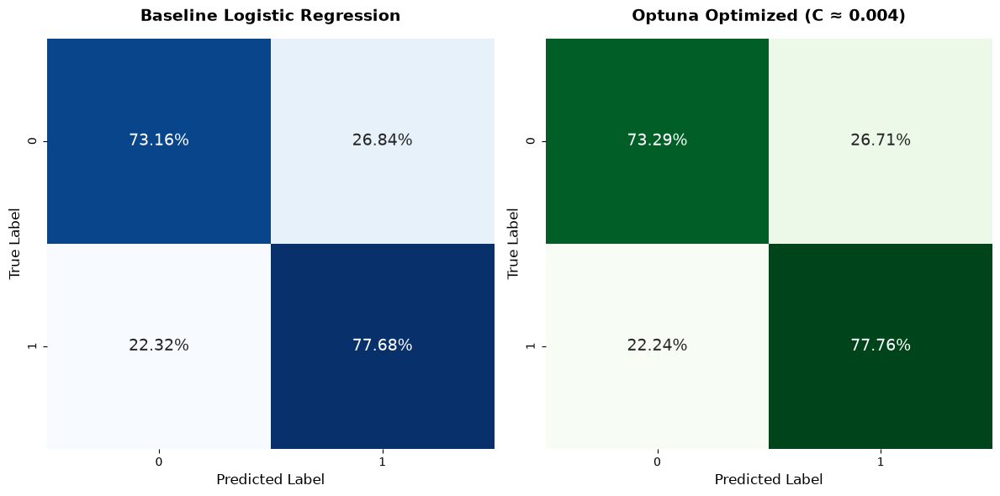

In [38]:
# calculate %s
cm_baseline = confusion_matrix(y_test, y_pred, normalize="true")
cm_optimized = confusion_matrix(y_test, y_lr_optimized, normalize="true")

# 1 row with 2 columns plot
fig, axes = plt.subplots(1, 2, figsize=(12, 6))


sns.heatmap(cm_baseline, annot=True, fmt='.2%', cmap='Blues', ax=axes[0], 
            cbar=False, annot_kws={"size": 14})
axes[0].set_title('Baseline Logistic Regression', fontsize=14, fontweight='bold', pad=15)
axes[0].set_xlabel('Predicted Label', fontsize=12)
axes[0].set_ylabel('True Label', fontsize=12)


sns.heatmap(cm_optimized, annot=True, fmt='.2%', cmap='Greens', ax=axes[1], 
            cbar=False, annot_kws={"size": 14})
axes[1].set_title('Optuna Optimized (C ≈ 0.004)', fontsize=14, fontweight='bold', pad=15)
axes[1].set_xlabel('Predicted Label', fontsize=12)
axes[1].set_ylabel('True Label', fontsize=12)


plt.tight_layout()
plt.show()

The optimization helped to slightly improve the accury of both "no diabetes" and "diabetes" class, using the test set which was unseen for the model.

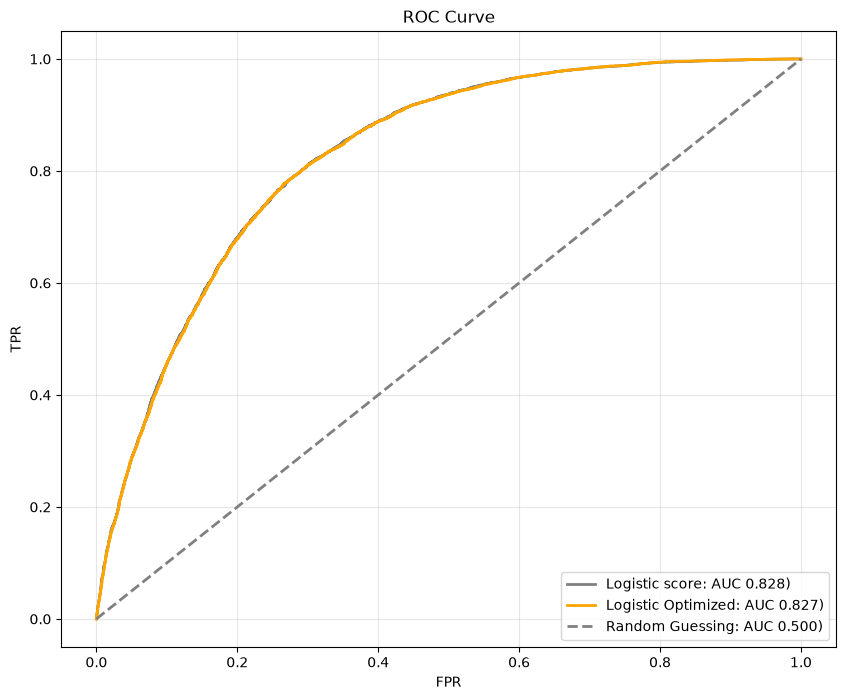

In [39]:
auc_score_lg = roc_auc_score(y_test, y_pred_prob)
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

auc_score_lg_opt = roc_auc_score(y_test, y_lr_optimized_proba)
fpr_opt, tpr_opt, thresholds_opt = roc_curve(y_test, y_lr_optimized_proba)


plt.figure(figsize=(10, 8))

# draw roc curve
plt.plot(fpr, tpr, color='gray', lw=2, label=f'Logistic score: AUC {auc_score_lg:.3f})')
plt.plot(fpr_opt, tpr_opt, color='orange', lw=2, label=f'Logistic Optimized: AUC {auc_score_lg_opt:.3f})')


# draw pure randomness line
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--', label='Random Guessing: AUC 0.500)')


plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

The AUC plot has no difference at all. This tells me that we could not really improve the model by hyperparameter tuning, perhaps feature engineering could help.

### XGBClassifier Optimization

#### Optimization system

In [40]:
import optuna


study_xgb = optuna.create_study(
    study_name="xgboost_v1",  
    storage="sqlite:///my_models.db",  
    direction="maximize",              
    load_if_exists=True                
)

[I 2026-09-16 16:26:29,576] Using an existing study with name 'xgboost_v1' instead of creating a new one.


Same search grid what I have created for Logistic Regression but tailored to the XGB model hyperparameters.

In [41]:
def objective_test(trial):
    param = {
        # tree Architecture
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        
        # learning Speed
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        
        # regularization
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-8, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-8, 10.0, log=True),
        'gamma': trial.suggest_float('gamma', 1e-8, 1.0, log=True),

        # aganst overfitting
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        
        # for faster run time
        'tree_method': 'hist',  
        'n_jobs': 1            
    }
    
    
    model = xgb.XGBClassifier(**param, random_state=42)
    
    # train model
    model.fit(x_train, y_train)
    
    # predict
    preds = model.predict(x_test)
    return accuracy_score(y_test, preds)

In [42]:
# Run the optimization!
study_xgb.optimize(objective_test, n_trials=1, show_progress_bar=True, n_jobs=-1)

  0%|          | 0/1 [00:00<?, ?it/s]

[I 2026-09-16 16:26:35,771] Trial 763 finished with value: 0.7599019238023388 and parameters: {'max_depth': 4, 'min_child_weight': 9, 'learning_rate': 0.014443956890669518, 'n_estimators': 792, 'reg_alpha': 6.790461975150946, 'reg_lambda': 0.001437476472252768, 'gamma': 6.361773421163953e-07, 'subsample': 0.7287599173258533, 'colsample_bytree': 0.962449447123443}. Best is trial 690 with value: 0.7605620520558279.


#### Visuals

XGB`s history plot looks the same as Logistic Regression. Started from 0.75 and quickly converge to 0.76 accuracy.

In [43]:
plot_optimization_history(study_xgb)

The importances plot is a bit more interesting. Here more hyperparameters explain the overall variance. The highest is learning rate, max_depth, reg_lambda.

In [44]:
plot_param_importances(study_xgb)

From slice plot I can also see a quadratic curve at 
- learning rate: at small steps(0.001) it overfits and underperforms on the test set, at higher learning rate it underfits, does not capture logic behind the dataframe.
- colsample_bytree: clusters around the right end at value 0.9-1
- subsample clusters around 0.8

In [45]:
plot_slice(study_xgb)

The parallel coordinate plot reveals the hyperparameter exploration strategy. Isolated lines represent the algorithm exploring the total parameter space. The thick, high-density bands of lines demonstrate algorithmic convergence. Where Optuna actively abandoned sub-optimal configurations only thin lines are visible.

In [46]:
plot_parallel_coordinate(study_xgb)

Now with two continous variables the contour plot is one of the most insightful chart. I can see where are the valleys and the spikes. At 0.25 learning rate and 400 estimators I can see a clear bright section indicating this is a lower accuracy combination. A section like this also appears on the top section at 0.13 learning rate and 1000 estimators.


On the other hand a spike shows at 0.02 with 700 estimators. And also Optuna used a lot of trials in this region.

In [47]:
fig = optuna.visualization.plot_contour(study_xgb, params=["learning_rate", "n_estimators"] )
show(fig)

Now with other combination is shows again, at 0.1 and 0.25 learning rate there are low points in accuracy. However max_depth does not really influence the objective value when the learning rate is small (0.01 - 0.03)

In [48]:
fig = optuna.visualization.plot_contour(study_xgb, params=["learning_rate", "max_depth"])
show(fig)

#### Before and After Optimization

In [49]:
# xgb model before
model_x = xgb.XGBClassifier()
model_x.fit(x_train, y_train)

y_pred_xgb = model_x.predict(x_test)
sample_pred_xgb = model_x.predict(x_train)
y_prob_xgb = model_x.predict_proba(x_test)[:,1]

In [50]:
# xgb model after
xgb_optimized = xgb.XGBClassifier(**study_xgb.best_params, random_state=11)
xgb_optimized.fit(x_train, y_train)

y_pred_xgb_opt = xgb_optimized.predict(x_test)
sample_pred_xgb_opt = xgb_optimized.predict(x_train)
y_prob_xgb_opt = xgb_optimized.predict_proba(x_test)[:,1]

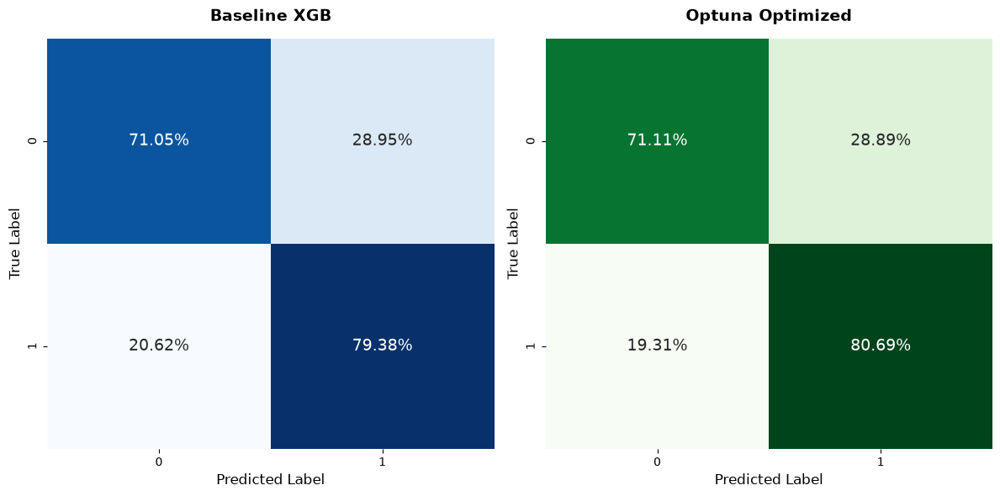

In [51]:
# calculate %s
xgb_baseline = confusion_matrix(y_test, y_pred_xgb, normalize="true")
xgbcm_optimized = confusion_matrix(y_test, y_pred_xgb_opt, normalize="true")

# 1 row with 2 columns plot
fig, axes = plt.subplots(1, 2, figsize=(12, 6))


sns.heatmap(xgb_baseline, annot=True, fmt='.2%', cmap='Blues', ax=axes[0], 
            cbar=False, annot_kws={"size": 14})
axes[0].set_title('Baseline XGB', fontsize=14, fontweight='bold', pad=15)
axes[0].set_xlabel('Predicted Label', fontsize=12)
axes[0].set_ylabel('True Label', fontsize=12)


sns.heatmap(xgbcm_optimized, annot=True, fmt='.2%', cmap='Greens', ax=axes[1], 
            cbar=False, annot_kws={"size": 14})
axes[1].set_title('Optuna Optimized', fontsize=14, fontweight='bold', pad=15)
axes[1].set_xlabel('Predicted Label', fontsize=12)
axes[1].set_ylabel('True Label', fontsize=12)


plt.tight_layout()
plt.show()

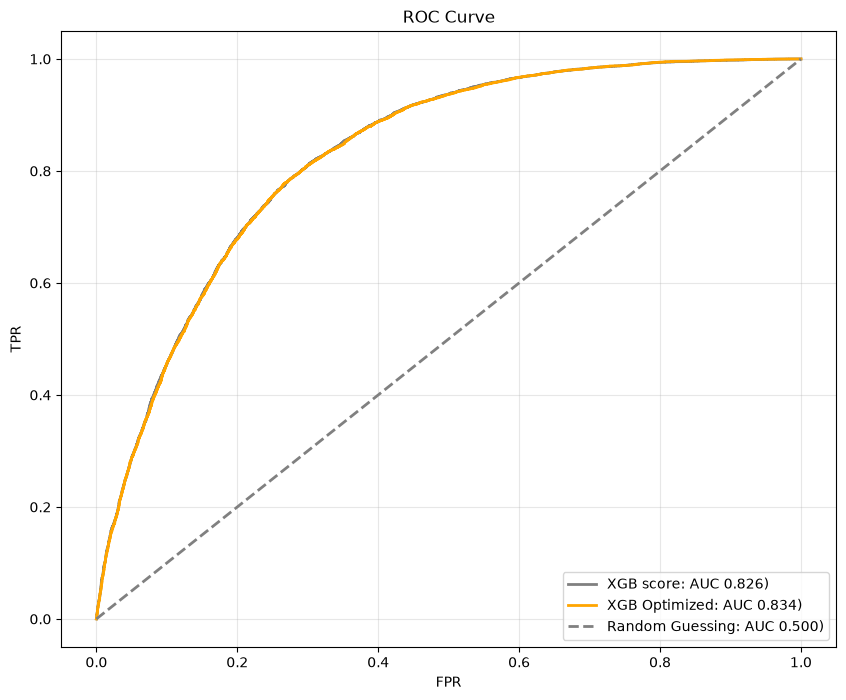

In [52]:
auc_score_xgb = roc_auc_score(y_test, y_prob_xgb)
fpr_x, tpr_x, thresholds_x = roc_curve(y_test, y_prob_xgb)

auc_score_xgb_opt = roc_auc_score(y_test, y_prob_xgb_opt)
fpr_optx, tpr_optx, thresholds_optx = roc_curve(y_test, y_prob_xgb_opt)


plt.figure(figsize=(10, 8))

# draw roc curve
plt.plot(fpr, tpr, color='gray', lw=2, label=f'XGB score: AUC {auc_score_xgb:.3f})')
plt.plot(fpr_opt, tpr_opt, color='orange', lw=2, label=f'XGB Optimized: AUC {auc_score_xgb_opt:.3f})')


# draw pure randomness line
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--', label='Random Guessing: AUC 0.500)')


plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

## 4. Explanatory analysis
- What features explain the predictions? 
- What features are responsible for diabetes? 
- Which does not have an influence? 

To answer these questions I will use the following methods:
1. Pearson Correaltion for linear releations
2. Trained models coefficients and built in importance
3. Mutual Information - sklearn
4. Permutation Importance
5. SHapley Additive exPlanations - SHAP

### 1. Pearson Correlation
This captures the linear releationships of the features with the target variable. If the releationship is truly linear then this is a good indicator, however the results are not causations, only relations. This means that they could move together, against each other, or have no correlation at all. However the result does not have predictive strength, I can not use a correlation of 0.82 to predict the targer variable. I can assume that this feature has the highest explanatory value.


GenHlth, HighBP and BMI have the highest correaltion, so I assume these will have the strongest predictive force in the models. (Only if the releationships are linear)

In [53]:
df.corr()["Diabetes_binary"].sort_values(ascending=False)

Diabetes_binary         1.000000
GenHlth                 0.407612
HighBP                  0.381516
BMI                     0.293373
HighChol                0.289213
Age                     0.278738
DiffWalk                0.272646
PhysHlth                0.213081
HeartDiseaseorAttack    0.211523
Stroke                  0.125427
CholCheck               0.115382
MentHlth                0.087029
Smoker                  0.085999
Sex                     0.044413
NoDocbcCost             0.040977
AnyHealthcare           0.023191
Fruits                 -0.054077
Veggies                -0.079293
HvyAlcoholConsump      -0.094853
PhysActivity           -0.158666
Education              -0.170481
Income                 -0.224449
Name: Diabetes_binary, dtype: float64

### 2. Trainend model coeffs, importances
I will look at the output of the two models, what is the logic behind, how important do they value each feature of the dataframe regarding the target variable.

#### Logistic Regression

In [54]:
importance = lr_optimized.coef_[0]

# simple df with column names
feature_importance = pd.DataFrame({
    'Feature': x_train.columns,
    'Importance': importance,
    'Absolute_Force': abs(importance)
}).sort_values(by='Absolute_Force', ascending=False)

feature_importance.head(7)

,Feature,Importance,Absolute_Force
0,HighBP,0.668658,0.668658
13,GenHlth,0.573143,0.573143
1,HighChol,0.515650,0.515650
2,CholCheck,0.509302,0.509302
10,HvyAlcoholConsump,-0.438491,0.438491
6,HeartDiseaseorAttack,0.227390,0.227390
17,Sex,0.226273,0.226273


In [55]:
feature_importance.tail(7)

,Feature,Importance,Absolute_Force
19,Education,-0.046551,0.046551
8,Fruits,-0.031384,0.031384
7,PhysActivity,-0.021732,0.021732
12,NoDocbcCost,-0.019242,0.019242
15,PhysHlth,-0.006303,0.006303
14,MentHlth,-0.004205,0.004205
4,Smoker,-0.003580,0.003580


Based on the Logistic regression coefficient output I can clearly see that HighBP, GenHlth, HighChol and CholCheck have high values. They have the strongest explanatory value in the model. Does it make sense?
- HighBP, yes high blood pressure could be a strong sign of diabetes
- GenHlth, once again if general health is below average this could imply diabetes
- HighChol, again this looks normal, it aligns with the overall logic of health
- HvyAlcoholConsump, now this does NOT align with the health logic, the model uses this feature to reduce the risk of having diabetes. Does it make sense that consuming alcohol reduces the risk of diabetes?
Absolutely no. This could happen because once a person gets diagnosed with diabetes, the alcohol consumption stops as of doctor`s recommendation, leaving the alcohol consumption to the "no_diabetes" group. So the ones who have not gotten sick yet are still in the healthy group with alcohol consumption.
This is called Reverse-Causality.

On the other hand, smoking, MentHlth, PhysHlth, Fruits and Vegetables does not have signifigance in predictions, they are also binary with small importance so I would classifiy them as noise.

How does a prediction work in logistic regression?

z = intercept + (f1 * coeff1) + (f2 * coeff2) + (f3 * coeff3) + ...

I can see that GenHtlh ranges from 0-5 while the rest are binary. This flips the importance list since it has a bigger scale and in the meantime also has 0.57 coeff. So this is the highest explanatory feautre as of now.

In [56]:
expalnatory_features = df[["HighBP", "GenHlth", "HighChol", "CholCheck", "HvyAlcoholConsump"]]
expalnatory_features.head(3)

,HighBP,GenHlth,HighChol,CholCheck,HvyAlcoholConsump
0,1.0,3.0,0.0,1.0,0.0
1,1.0,3.0,1.0,1.0,0.0
2,0.0,1.0,0.0,1.0,0.0


The fitted intercept also provides information. If I calculate the probability for the intercept I get 0.25%. This means that the diabetes is rare on intercept level. If a patient walk into a hospital without providing any information it has a 0.25% chance that he has diabetes.

In [57]:
lr_optimized.intercept_ # gives back log odds which is -5.96 in this case

p = 1/(1+ np.exp(-lr_optimized.intercept_))
print(lr_optimized.intercept_, p)

[-5.96792966] [0.002553]


#### XGBClassifier

Moving to the other model, I will use its importance plot for findig out the core logic behind the scenes. Here I can see that once again the top 3 features are the same with logistic regression. This suggests me that these 3 features are predictive variables for diabetes.

Here HighBP dominates then GenHlth. And the importance wears off gradually. Age and BMI are ranked higher here than in the Logistics Regression. Both models found valid logical gates that almost has in the same result using two different paths. And now, alchohol is down the line, it does not have a huge influence.

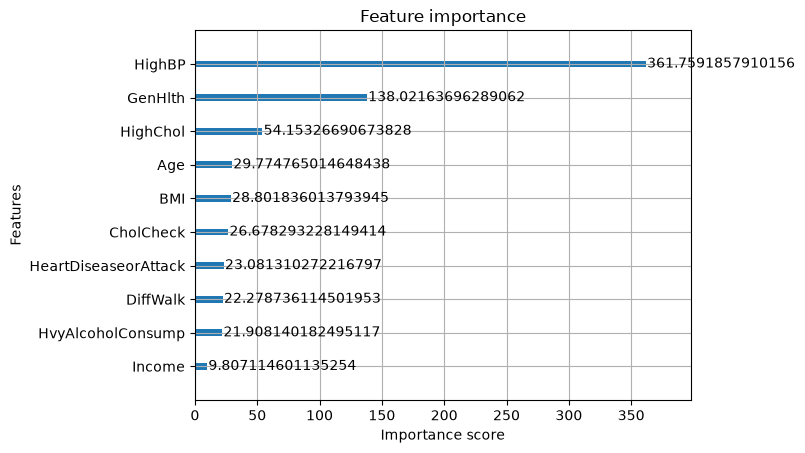

In [58]:
from xgboost import plot_importance

plot_importance(xgb_optimized, importance_type='gain', max_num_features=10)
plt.show()

### 3. Mutual Information
While the Pearson Correlation looks at the linear releationships it can not see whether there is non-linear releationship. Mutual information uses Information Theory, it does not care about curves, lines, direction. 

It answers a simple question: If I know the value of this feature, how much uncertainty does it remove about the patient`s diabetes?

In [59]:
# import the library
from sklearn.feature_selection import mutual_info_classif

# calculate the scores, uses randomess in sampling that is why i used random state
mi_raw_scores = mutual_info_classif(x_train, y_train, random_state=11)

# creating a series
mi_series = pd.Series(mi_raw_scores, index=x_train.columns)
mi_sorted = mi_series.sort_values(ascending=False)

mi_sorted

GenHlth                 0.096620
HighBP                  0.083619
BMI                     0.055668
Age                     0.048432
HighChol                0.046347
DiffWalk                0.037408
Income                  0.030646
PhysHlth                0.027574
HeartDiseaseorAttack    0.025045
PhysActivity            0.021294
Education               0.015723
CholCheck               0.010379
Veggies                 0.006907
Smoker                  0.006840
Stroke                  0.006487
Fruits                  0.005907
AnyHealthcare           0.004805
MentHlth                0.004527
HvyAlcoholConsump       0.002896
NoDocbcCost             0.000005
Sex                     0.000000
dtype: float64

Again the top results matches what I have seen before. The according to MI the most important features are GenHlth, HighBP, BMI and Age. On the other hand Sex does not play a role at all. It is equally likely to have diabetes in both genders. However I will not drop this column since the XGB could build trees that combine Sex with different features and create usable logic.

### 4. Permutation Importance

Permutation importance works on a simple intuition: If a feature is truly important, then shuffling the records in that column will reduce the performance of the model. The bigger the drop in accuracy, the more critical the feature is to the model's ecosystem

It is good for seeing the magnitude of change in objective value, but this approach is blind to direction.

In [60]:
from sklearn.inspection import permutation_importance

perm_results = permutation_importance(
    lr_optimized, 
    x_test, 
    y_test, 
    n_repeats=5, 
    random_state=11, 
    scoring="accuracy"
)

# 2. Extract the mean drop in accuracy for each feature
perm_scores = pd.Series(perm_results.importances_mean, index=x_test.columns)

# 3. Sort and view the true real-world leaderboard
perm_scores.sort_values(ascending=False)

GenHlth                 0.058355
BMI                     0.036420
Age                     0.030234
HighBP                  0.019247
HighChol                0.011826
Sex                     0.003376
Income                  0.003291
HvyAlcoholConsump       0.002339
HeartDiseaseorAttack    0.001943
CholCheck               0.001905
Education               0.001565
PhysHlth                0.001273
DiffWalk                0.000736
Veggies                 0.000726
AnyHealthcare           0.000462
Fruits                  0.000434
PhysActivity            0.000406
MentHlth                0.000387
Stroke                  0.000207
NoDocbcCost             0.000075
Smoker                 -0.000123
dtype: float64

In [61]:
from sklearn.inspection import permutation_importance

# 1. Run the Permutation Algorithm
# (n_repeats=5 means it shuffles each column 5 times to get a stable average)
perm_results1 = permutation_importance(
    xgb_optimized, 
    x_test, 
    y_test, 
    n_repeats=5, 
    random_state=11, 
    scoring="accuracy"
)

# 2. Extract the mean drop in accuracy for each feature
perm_scores1 = pd.Series(perm_results1.importances_mean, index=x_test.columns)

# 3. Sort and view the true real-world leaderboard
perm_scores1.sort_values(ascending=False)

GenHlth                 0.047492
BMI                     0.030960
Age                     0.028084
HighBP                  0.015871
HighChol                0.010194
Income                  0.004376
CholCheck               0.004102
Sex                     0.003763
HvyAlcoholConsump       0.003386
HeartDiseaseorAttack    0.001763
MentHlth                0.001235
Stroke                  0.001018
Education               0.000905
DiffWalk                0.000754
Veggies                 0.000585
PhysHlth                0.000415
Fruits                  0.000292
Smoker                  0.000151
NoDocbcCost            -0.000028
AnyHealthcare          -0.000075
PhysActivity           -0.000123
dtype: float64

Once again, GenHlth, HighBP, BMI and Age dominated the predictions.

### 5. SHAP

SHAP is the gold standard library for understanding the core mechanism of any built model. Originated from game theory, it cracks open the black box to reveal the exact mathematical rules, logic gates, and feature weights the model used to choose a specific class for a specific prediction.

It not only shows the magnitude but also the directions, so I can easily interpret how a single predictions arrive at their final probability/class.

#### Summary Plot

Background dataset has 49484 samples but max_samples=100. Subsampling to 100 samples for SHAP value computation. To use all samples, set max_samples=49484 when initializing the masker.


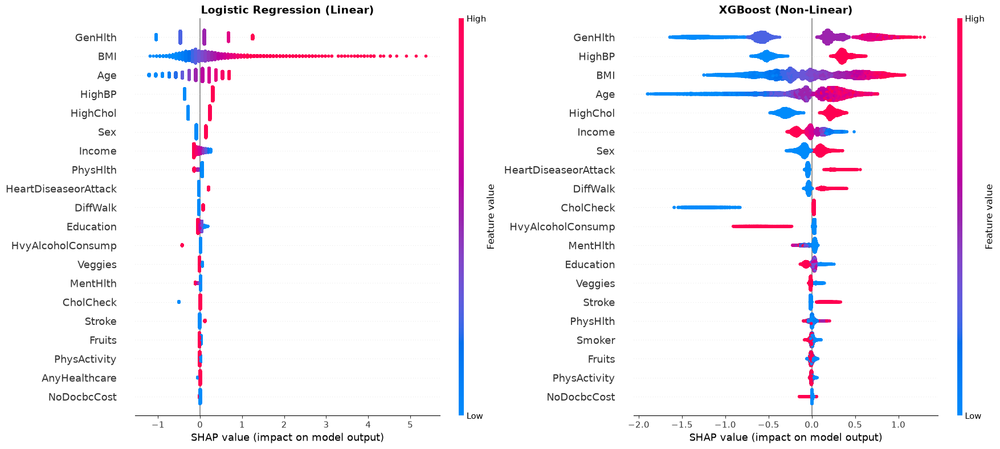

In [62]:
import shap

# Logistic Regression
explainer_lr = shap.LinearExplainer(lr_optimized, x_train)
shap_values_lr = explainer_lr.shap_values(x_test)

# XGB
explainer_xgb = shap.TreeExplainer(xgb_optimized) #fit the optimized xgb model
shap_values_xgb= explainer_xgb.shap_values(x_test)  #calculate shap value


# generate the plot 
plt.figure(figsize=(18, 8))


plt.subplot(1, 2, 1)
shap.summary_plot(shap_values_lr, x_test, show=False, plot_size=None)
plt.title("Logistic Regression (Linear)", fontsize=14, fontweight='bold')


plt.subplot(1, 2, 2)
shap.summary_plot(shap_values_xgb, x_test, show=False, plot_size=None)
plt.title("XGBoost (Non-Linear)", fontsize=14, fontweight='bold')


plt.tight_layout()
plt.show()

Summary plot generates a clear explanataion about the feature set. The features are sorted from top to bottom with highest feature importance being at the top. Then on the left side of each feature there is a violin plot with color differentiation.

- Red: Means that the patient had a high observed value in that feature. So it could be 1 for HighBP or 5 for GenHlth.
- Blue: Means that the patient had a low observed value. 0 for BP and 1 for GenHlth

The X axis distribution shows in what direction did that feature push with the known value (red/blue). If I look at the most important feature I can see that:
1. GenHlth (1- excellent 5- poor): If this feautre increases, then the risk of having diabetes also increases, as it pushes shap value to the positive side.
Both models show the same insight: Positive releationship with target variable. Excellent general health significantly decreases the risk.

2. BMI (continous variable): Higher BMI means more fat on a person. Once again both models align, positive releationship with targer variable. High BMI, high risk of diabetes

3. HighBP (0-no, 1-yes): Clear, aligned responses. If a patient has high blood pressure then it increases the risk of having diabetes

4. Age (increasing groups): Being young decreases the risk while being old increases. But there is a difference between the models.
The Linear model shows me from the plot that each 20 year old group has the same effect on the diabetes, while the non-linear sees it other. It shows that being in your 20s is a high protective shield against diabetes, however as you get older the risk of diabetes platous at around 60 years old. Which means it is not a linear releationship. Being 90 years means that the risk is almost the same with being 60 years old.

5. Income (1= less than 10.000$, 8 = 75.00$ or more): Now this is an inverse relationship as red is on the left side while blue is on the right side (increases shap value). This makes sense, having more disposable income gives the patient the chance to purchase healthier food and live a more balanced life.

6. Heavy Alcohol Consumption (0-no, 1-yes): This is a critical anomaly, the plot says that heavy drinking (red) decreases the risk of having diabetes. Does it logically make sense? Not at all, it is likely that the patients that got diagnosed with diabetes are ordered to stop consuming alcohol, so the only group left with heavy alcohol consumption is the healthy one. Since this is a contradiction I would 100% remove this column since the model rewards patients who drink heavly.

7. Education: Higher education, reduces the risk for both models, altough this is not a major effect.


Features that are not visible and that are shown at the bottom are not significant, dropping these should not make the models worse, even it could help by removing the noise they brind. So the models can focus truly on the usefule information.

#### Bar plot

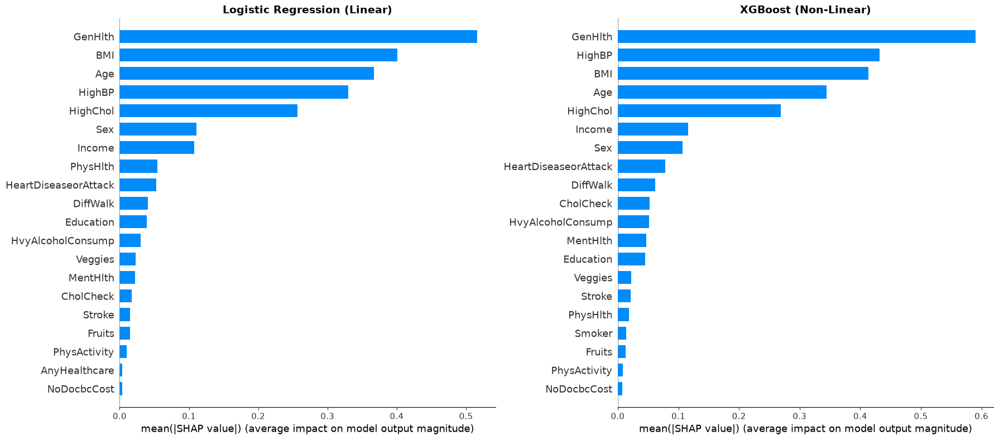

In [63]:
# generate the plot 
plt.figure(figsize=(18, 8))


plt.subplot(1, 2, 1)
shap.summary_plot(shap_values_lr, x_test, show=False, plot_size=None, plot_type="bar")
plt.title("Logistic Regression (Linear)", fontsize=14, fontweight='bold')


plt.subplot(1, 2, 2)
shap.summary_plot(shap_values_xgb, x_test, show=False, plot_size=None, plot_type="bar")
plt.title("XGBoost (Non-Linear)", fontsize=14, fontweight='bold')


plt.tight_layout()
plt.show()

Looking at the absolute value bar plot I see that the two models share the most importance features, which are: GenHlth, BMI, Age, HighBP, HighChol, Income. Whille there are 21 columns in total I do not see them all. Features at he bottom has no importance, so the features that are not shown have even less importance. I will drop those as a step towards a cleaner dataframe.

#### Waterfall Plot

Background dataset has 49484 samples but max_samples=100. Subsampling to 100 samples for SHAP value computation. To use all samples, set max_samples=49484 when initializing the masker.


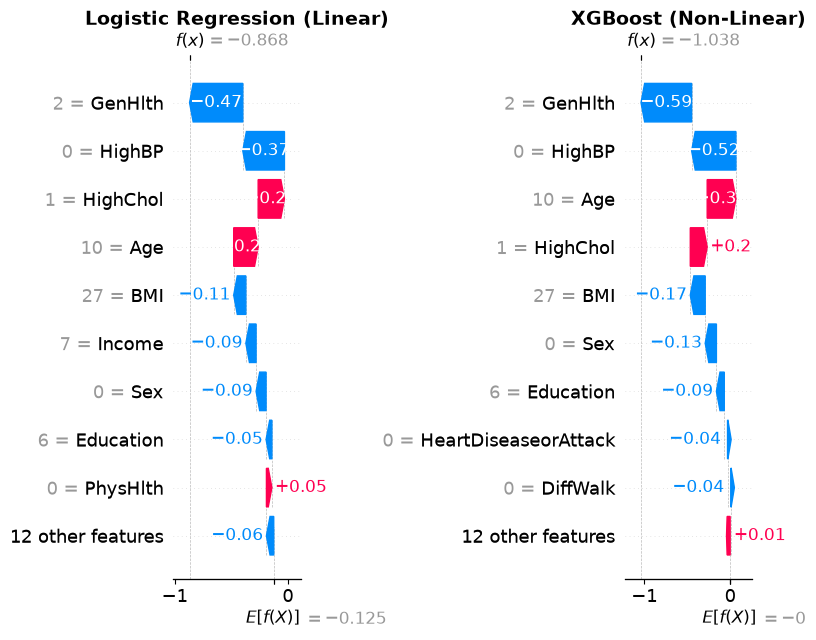

In [64]:
# logistic values
explainer_modern = shap.Explainer(lr_optimized, x_train)
shap_values_obj = explainer_modern(x_test)

# xgb values
explainer_modern_xgb = shap.Explainer(xgb_optimized)
shap_values_obj_xgb = explainer_modern_xgb(x_test)

fig = plt.figure()

plt.subplot(1, 2, 1)
shap.plots.waterfall(shap_values_obj[17], show=False) 
plt.title("Logistic Regression (Linear)", fontsize=14, fontweight='bold')


plt.subplot(1, 2, 2)
shap.plots.waterfall(shap_values_obj_xgb[17], show=False)
plt.title("XGBoost (Non-Linear)", fontsize=14, fontweight='bold')


plt.tight_layout(w_pad=2.0)
plt.show()

Waterfall plot graphs how one patient got their prediction for the diabetes class.

At the very bottom of the charts at $E[f(X)]$ is visible.
This is the baseline expected value. If the model knew absolutely nothing about this patient, this is the average mathematical risk score for the entire dataset. For the linear model, it starts at -0.125. 

Each feature adds or removes shap values that push the target variable either in diabetes or no_diabetes class. Blue arrows are risk reducers and red arrows are risk elevators It is also seen that the first feature has the most weight and this weight wears off as it moves lower in the feature list.

After the features effects were summed, the f(x) value resulted in -0.868 orr -1.034 which is highly negative -> the patient likely predicted as no_diabetes.

#### Force plot

In [65]:
# Initialize the JavaScript visualizer in your notebook
shap.initjs()

plt.subplot(1, 2, 1)
# Manually pass the baseline expected value, the raw SHAP array for Patient 0, and their original data
shap.plots.force(
    explainer_lr.expected_value, 
    shap_values_lr[17], 
    x_test.iloc[17]
)

In [66]:
shap.initjs()

plt.subplot(1, 2, 2)
shap.plots.force(
    explainer_xgb.expected_value, 
    shap_values_xgb[17], 
    x_test.iloc[17]
)

The force plot is similar to the waterfall plot, as it also shows how the final SHAP value got created for a single patient. It also includes the features and their input.

#### Decision Plot

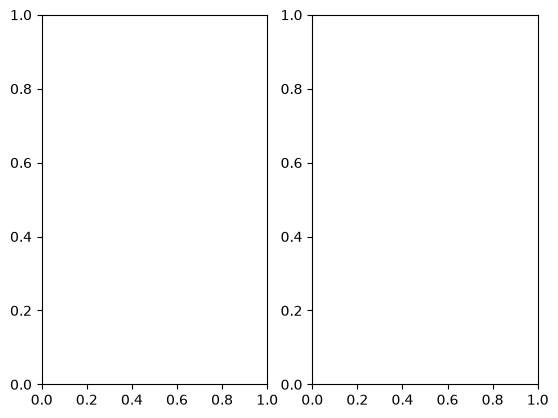

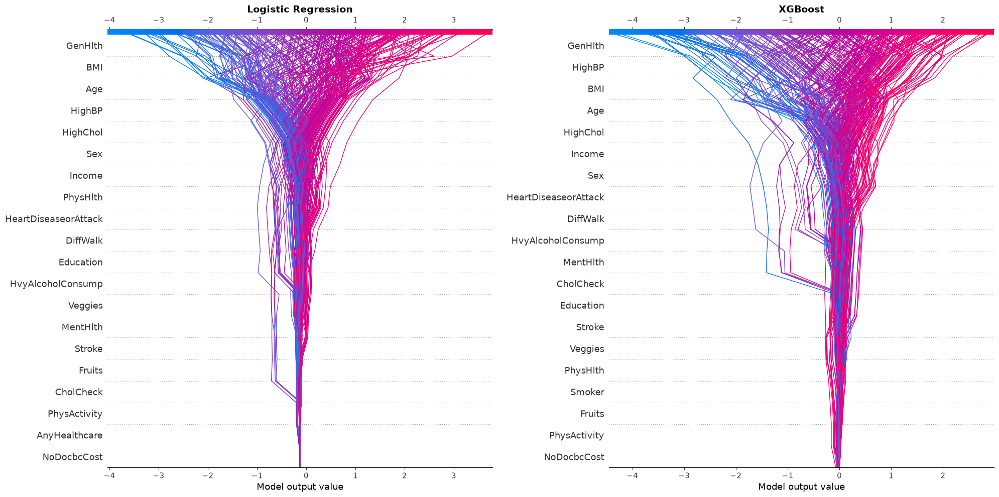

In [67]:
fig = plt.figure()

# 2. Draw Left Side
plt.subplot(1, 2, 1)
shap.plots.decision(
    shap_values_obj.base_values[0], 
    shap_values_obj.values[0:250], 
    x_test.iloc[0:250],
    ignore_warnings=True,
    show=False
)
plt.title("Logistic Regression", fontsize=14, fontweight='bold')

# 3. Draw Right Side
plt.subplot(1, 2, 2)
shap.plots.decision(
    shap_values_obj_xgb.base_values[0], 
    shap_values_obj_xgb.values[0:250], 
    x_test.iloc[0:250],
    ignore_warnings=True,
    show=False
)
plt.title("XGBoost", fontsize=14, fontweight='bold')

# 4. THE FIX: Force the *existing* figure to stretch right before rendering
# 24 width gives horizontal breathing room, 10 height spaces out the 21 features
fig.set_size_inches(20, 10)

# 5. THE PADDING: Force a gap between the left and right charts
plt.tight_layout(w_pad=2.0)
plt.show()

The decision plot is an elegant way to visualize the cumulative mathematical journey of multiple patients at once. Here I used a subset of 250 patients. It tracks the prediction trajectory from the baseline expectation at the bottom to the final output at the top. The plot naturally forms a funnel shape, starting narrow at the base and expanding out widely at the top. 

The narrow base visually proves that the bottom features have virtually zero impact on the target variable the lines travel straight up without deviating. As the lines reach the most important features at the top, the accumulated SHAP values cause them to violently snap left (decreasing risk) or right (increasing risk), fanning out into their final individual diagnoses. This visualization perfectly justifies dropping low-importance features, as they do not meaningfully steer the model's final decision. The two models, once again evaulate most of the features the same. That is why the funnel looks identical.

#### Scatter Plot

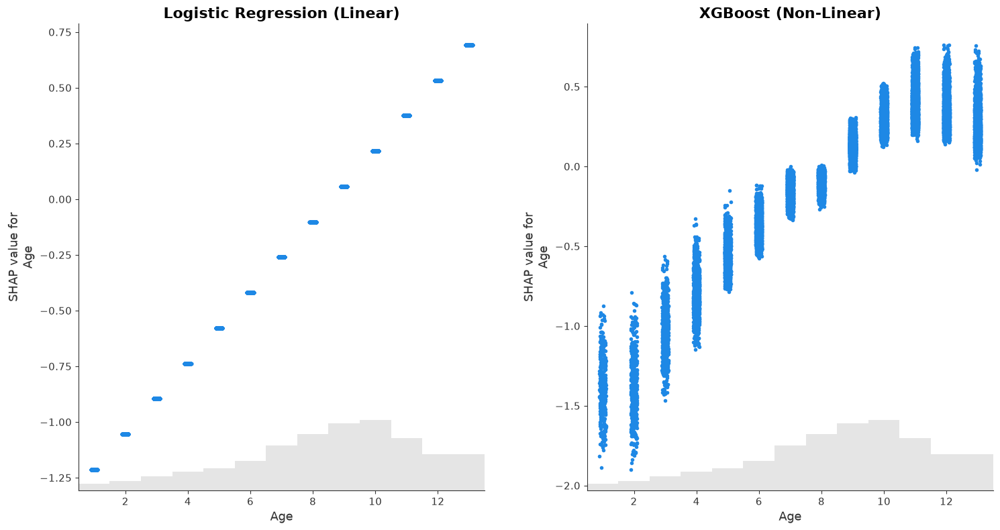

In [68]:
# 1. Create EXACTLY ONE massive canvas
fig = plt.figure(figsize=(15, 8))

# 2. Activate the Left Subplot
plt.subplot(1, 2, 1)
# THE FIX: Tell SHAP to strictly use the current active subplot (plt.gca())
shap.plots.scatter(shap_values_obj[:, "Age"], ax=plt.gca(), show=False)
plt.title("Logistic Regression (Linear)", fontsize=16, fontweight='bold')

# 3. Activate the Right Subplot
plt.subplot(1, 2, 2)
# THE FIX: Tell SHAP to strictly use the current active subplot (plt.gca())
shap.plots.scatter(shap_values_obj_xgb[:, "Age"], ax=plt.gca(), show=False)
plt.title("XGBoost (Non-Linear)", fontsize=16, fontweight='bold')

# 4. Render the united dashboard
plt.tight_layout(w_pad=4.0)
plt.show()

The scatter plot visualizes every patients record for a given feature and their assigned SHAP value with a single dot. So on the chart I can see all of the patients shap values and their age groups.

Two different interpretability: 

- Logistic regression is a linear model, and it is visible from the line on the left slide, there is no curve at all, just a single line with a fixed slope. It means that as a person gets older the risk of having diabetes increases

- On the other hand XGB can capture non-linear releationships. It is visible on the right side. The scatterplot looks like a negative quadratic equation, or a function with diminishing effects as age increases. From age group 1 to 10 the risk of having diabetes increases, but after 10 it plateaus. Being older than group 10, does not increase the risk. The model correctly learned that aging past a certain threshold does not infinitely increase your risk; instead, the SHAP values simply spread out vertically.

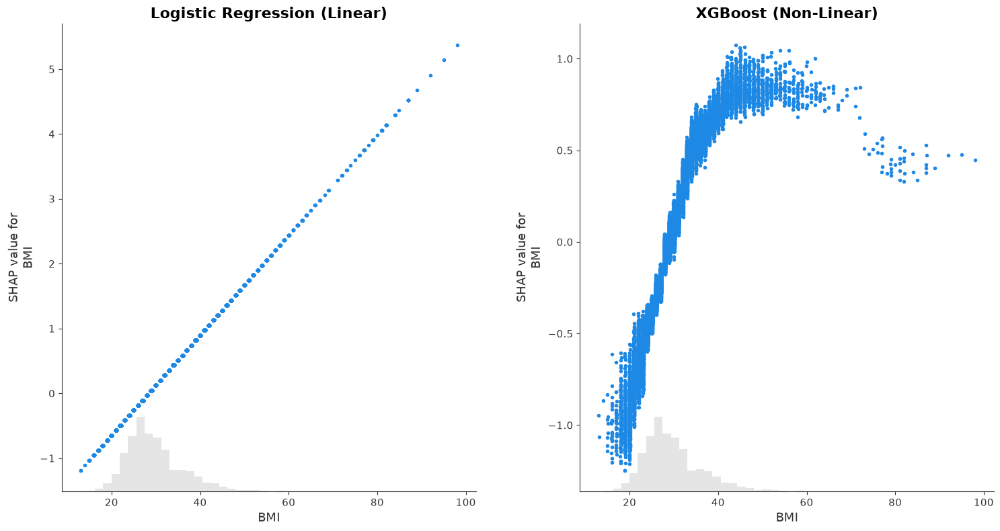

In [69]:
# 1. Create EXACTLY ONE massive canvas
fig = plt.figure(figsize=(15, 8))

# 2. Activate the Left Subplot
plt.subplot(1, 2, 1)
# THE FIX: Tell SHAP to strictly use the current active subplot (plt.gca())
shap.plots.scatter(shap_values_obj[:, "BMI"], ax=plt.gca(), show=False)
plt.title("Logistic Regression (Linear)", fontsize=16, fontweight='bold')

# 3. Activate the Right Subplot
plt.subplot(1, 2, 2)
# THE FIX: Tell SHAP to strictly use the current active subplot (plt.gca())
shap.plots.scatter(shap_values_obj_xgb[:, "BMI"], ax=plt.gca(), show=False)
plt.title("XGBoost (Non-Linear)", fontsize=16, fontweight='bold')

# 4. Render the united dashboard
plt.tight_layout(w_pad=4.0)
plt.show()

Another scatter plot with differen feature. The BMI is also a continous variable, and here once again I can see the linear, and non-linear model output.

Logistic regression predicts that as BMI increases to infinity so does the risk of having diabetes. While XGB first has a positive slope, as BMI increases the shap value also increases, but it plateaus at around 45 BMI, then it turns into a negative slope, meaning having extremely high BMI decreases the risk. This does not make sense, this could happen because of data deficit. I can see that the BMI distribution is heavly right skewed, there are only a few people who have extremely high BMI and most of them have a lower risk. It is just pure chance.

## 5. Feature selection - Retrain

### 1. Filtering by logic

In [70]:
dn = df.copy() # (dn = datanew)

Starting with the two features that needs to be dropped without future investigation.

- CholCheck as it is heavily imbalanced, 98% is 1s and the rest is 0s, it basically just noise, and the model could overfit
- HvyAlcoholConsump, as I have seen it above it generates reverse causality, meaning the models rewards people who drink insted of penalizing them.

In [71]:
dn["CholCheck"].value_counts(normalize=True)

CholCheck
1.0    0.975259
0.0    0.024741
Name: proportion, dtype: float64

In [72]:
dn[["Diabetes_binary", "HvyAlcoholConsump"]].value_counts(normalize=True)

# 0 no
# 1 yes

Diabetes_binary  HvyAlcoholConsump
1.0              0.0                  0.488231
0.0              0.0                  0.469049
                 1.0                  0.030951
1.0              1.0                  0.011769
Name: proportion, dtype: float64

From the table:
- If someone has diabetes and drinks heavly that is only 1.1% of the dataframe
- If someonne has diabetes but does not drink heavily that is 48.8% of the cases
- If someone has no diabetes and does not drink that is 46.9%
- If someone has no diabetes but drinks heavily that is 3.0%

From this it is easy to see that the model rewards drinkning. As the ratio of not drinking and drinking heavily is almost 50x higher in the diabetes group.

In [73]:
dn = dn.drop(columns=["HvyAlcoholConsump", "CholCheck"], errors="ignore")

In [74]:
dn.columns

Index(['Diabetes_binary', 'HighBP', 'HighChol', 'BMI', 'Smoker', 'Stroke',
       'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'AnyHealthcare', 'NoDocbcCost', 'GenHlth', 'MentHlth', 'PhysHlth',
       'DiffWalk', 'Sex', 'Age', 'Education', 'Income'],
      dtype='str')

### 2. From Explanatory section
I will keep the important features that the mathematical algorithms found in the previous section. I will look at the top performing features on the plot, and outputs. Then create the new dataframe with those column masks.


The most important feautes that appear at the top in almost every evaulation are:
- GenHlth
- BMI
- HighBP
- Age
- HighChol

From the plots I need to define a border from where I cut off the feature that are less important. I have to find an elbow point, where adding another feautre does not imporve the model.

An interesting note is that, fruits, veggeis and smoking has no effect according to the dataframe

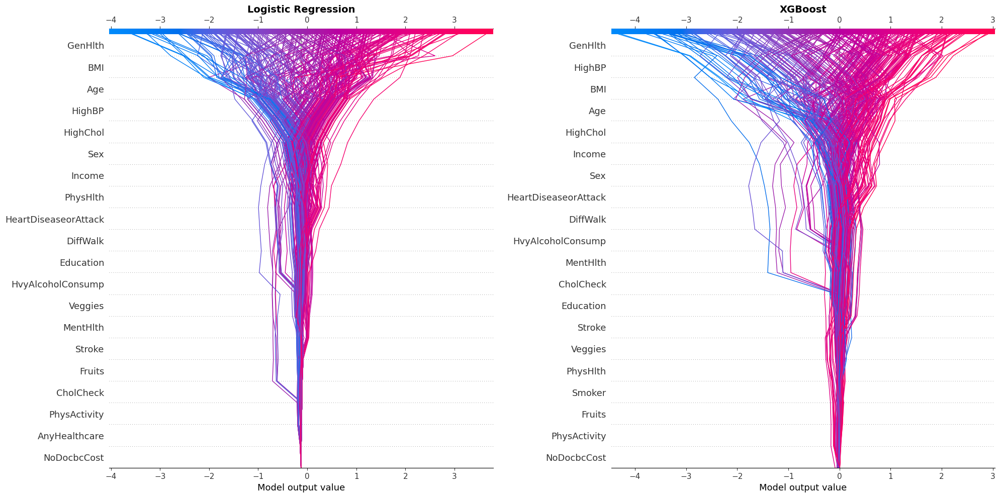

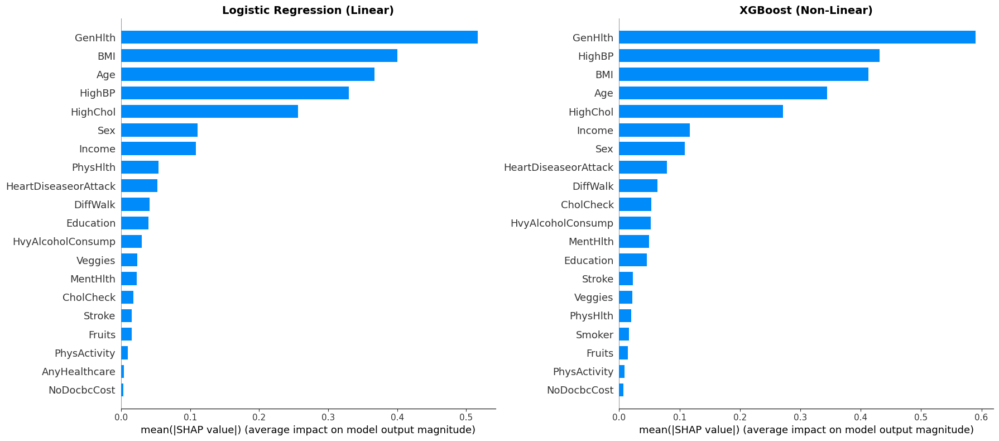

I draw a borderline at Education, and create a subset from the Logistic Regression`s results, since it does not include alcohol consumption and CholCheck above it.

In [75]:
selected_features = ["GenHlth", "BMI", "Age", "HighBP", "HighChol", "Sex", "Income", "HeartDiseaseorAttack", "DiffWalk", "Education", "MentHlth", "PhysHlth", "Diabetes_binary"]

In [76]:
dn = dn[selected_features]
dn

,GenHlth,BMI,Age,HighBP,HighChol,Sex,Income,HeartDiseaseorAttack,DiffWalk,Education,MentHlth,PhysHlth,Diabetes_binary
0,3.0,26.0,4.0,1.0,0.0,1.0,8.0,0.0,0.0,6.0,5.0,30.0,0.0
1,3.0,26.0,12.0,1.0,1.0,1.0,8.0,0.0,0.0,6.0,0.0,0.0,0.0
2,1.0,26.0,13.0,0.0,0.0,1.0,8.0,0.0,0.0,6.0,0.0,10.0,0.0
3,3.0,28.0,11.0,1.0,1.0,1.0,8.0,0.0,0.0,6.0,0.0,3.0,0.0
4,2.0,29.0,8.0,0.0,0.0,0.0,8.0,0.0,0.0,5.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
70687,4.0,37.0,6.0,0.0,1.0,0.0,1.0,0.0,0.0,4.0,0.0,0.0,1.0
70688,2.0,29.0,10.0,0.0,1.0,1.0,6.0,1.0,1.0,3.0,0.0,0.0,1.0
70689,5.0,25.0,13.0,1.0,1.0,0.0,4.0,1.0,1.0,6.0,15.0,0.0,1.0
70690,4.0,18.0,11.0,1.0,1.0,0.0,4.0,0.0,1.0,2.0,0.0,0.0,1.0


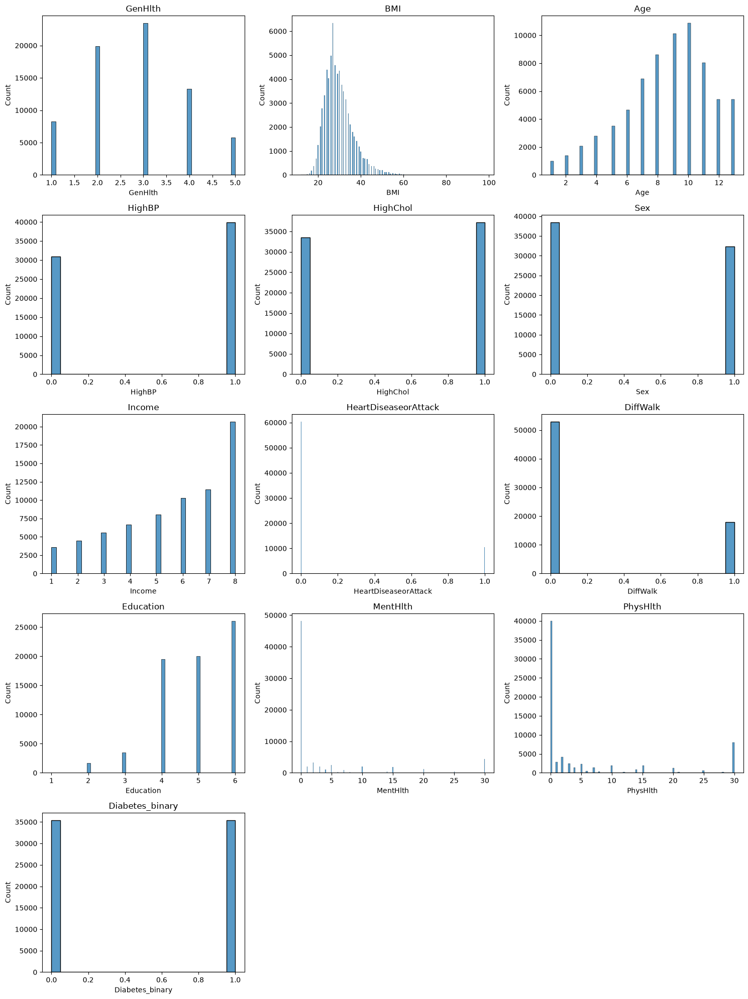

In [77]:
# how many rows
num_cols = len(dn.columns)
grid_rows = math.ceil(num_cols / 3)

# create grid
fig, axes = plt.subplots(nrows=grid_rows, ncols=3, figsize=(15, 4 * grid_rows))
axes = axes.flatten()

# loop through columns
for index, col_name in enumerate(dn.columns):
    sns.histplot(dn[col_name], ax=axes[index])
    axes[index].set_title(col_name)

# hide the rest of the charts
for extra in range(num_cols, len(axes)):
    fig.delaxes(axes[extra])

plt.tight_layout() # Prevents the charts from overlapping

plt.show()

Looking at the plot I see:

- I see that MentHlth and PhyHlth have a weird distribution, so insted of this distribution I will form those column into yes/no binary columns.
- One more modification I will make is to scale the BMI as it is heavily right skewed

The rest of the distributions look normal and valuable for machine learning models

In [78]:
# no data leakage from train to test so i can do it for the whole dataset,
# these are just simple value record techniques
dn["MentHlth"] = (dn["MentHlth"] > 0).astype(int) 

dn["PhysHlth"] = (dn["PhysHlth"] > 0).astype(int)

dn["BMI_log"] = np.log(dn["BMI"])
dn.drop(columns=["BMI"], inplace=True)

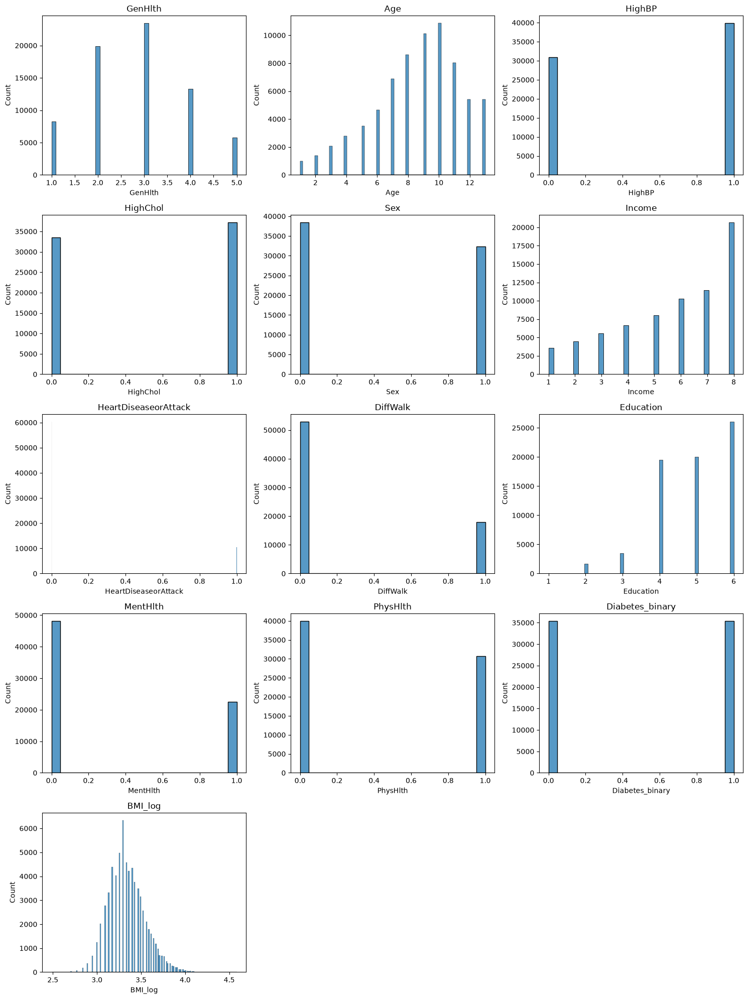

In [79]:
# how many rows
num_cols = len(dn.columns)
grid_rows = math.ceil(num_cols / 3)

# create grid
fig, axes = plt.subplots(nrows=grid_rows, ncols=3, figsize=(15, 4 * grid_rows))
axes = axes.flatten()

# loop through columns
for index, col_name in enumerate(dn.columns):
    sns.histplot(dn[col_name], ax=axes[index])
    axes[index].set_title(col_name)

# hide the rest of the charts
for extra in range(num_cols, len(axes)):
    fig.delaxes(axes[extra])

plt.tight_layout() # Prevents the charts from overlapping

plt.show()

Now I can say that, the feautres are cleaned, aligned, not important ones are dropped so the dataframe is ready for use.

### 3. Retrain models

#### Logistic

In [80]:
# splitting into features and target variable
x1 = dn.drop(columns=["Diabetes_binary"])
y1 = dn["Diabetes_binary"]

In [81]:
x_train1, x_test1, y_train1, y_test1 = train_test_split(x1, y1, stratify=y, random_state=11, test_size=0.3)

In [82]:
lr = LogisticRegression(max_iter=2000, random_state=11) 
lr.fit(x_train1, y_train1) 

# creating predictions
y_pred1 = lr.predict(x_test1)
y_pred_sample1 = lr.predict(x_train1)
y_pred_prob1 = lr.predict_proba(x_test1)[:,1]

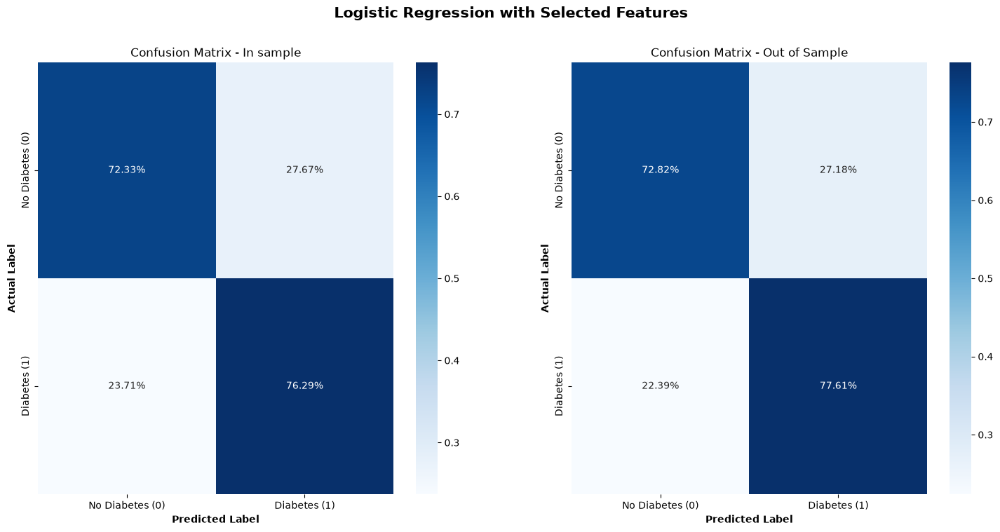

In [83]:
# Evaulation
my_classes = ["No Diabetes (0)", "Diabetes (1)"]


plt.figure(figsize=(18, 8))

plt.subplot(1, 2, 1)
sns.heatmap(confusion_matrix(y_train1, y_pred_sample1, normalize="true"), 
            annot=True, 
            cmap="Blues", 
            fmt=".2%",
            xticklabels=my_classes, 
            yticklabels=my_classes) 


plt.xlabel("Predicted Label", fontweight='bold')
plt.ylabel("Actual Label", fontweight='bold')
plt.title("Confusion Matrix - In sample")

plt.subplot(1, 2, 2)
sns.heatmap(confusion_matrix(y_test1, y_pred1, normalize="true"), 
            annot=True, 
            cmap="Blues", 
            fmt=".2%",
            xticklabels=my_classes, 
            yticklabels=my_classes) 


plt.xlabel("Predicted Label", fontweight='bold')
plt.ylabel("Actual Label", fontweight='bold')
plt.title("Confusion Matrix - Out of Sample")

plt.suptitle("Logistic Regression with Selected Features", fontsize=15, fontweight='bold')
plt.show()

#### XGB

In [84]:
model_x = xgb.XGBClassifier()
model_x.fit(x_train1, y_train1)

y_pred_xgb1 = model_x.predict(x_test1)
y_pred_sample_xgb1 = model_x.predict(x_train1)
y_prob_xgb1 = model_x.predict_proba(x_test1)[:,1]

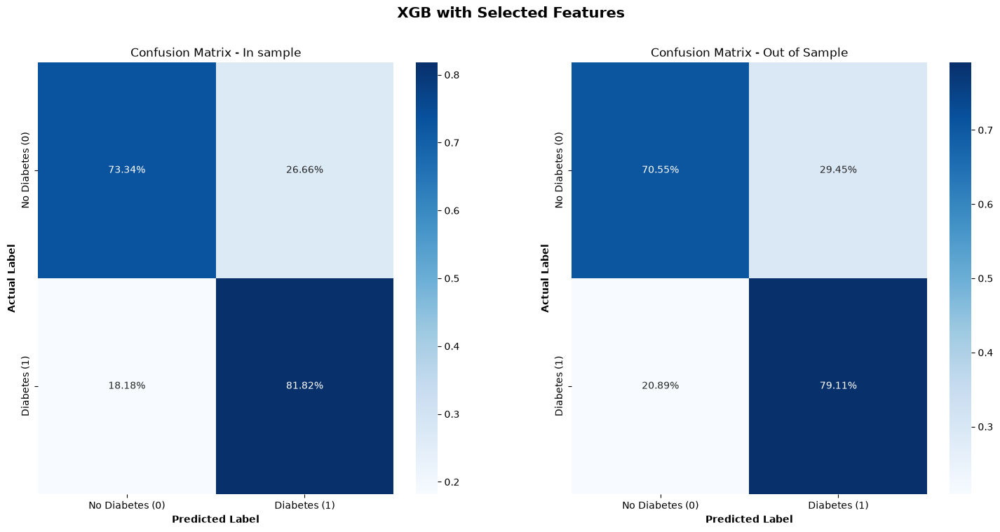

In [85]:
# Evaulation
my_classes = ["No Diabetes (0)", "Diabetes (1)"]


plt.figure(figsize=(18, 8))

plt.subplot(1, 2, 1)
sns.heatmap(confusion_matrix(y_train1, y_pred_sample_xgb1, normalize="true"), 
            annot=True, 
            cmap="Blues", 
            fmt=".2%",
            xticklabels=my_classes, 
            yticklabels=my_classes) 


plt.xlabel("Predicted Label", fontweight='bold')
plt.ylabel("Actual Label", fontweight='bold')
plt.title("Confusion Matrix - In sample")

plt.subplot(1, 2, 2)
sns.heatmap(confusion_matrix(y_test1, y_pred_xgb1, normalize="true"), 
            annot=True, 
            cmap="Blues", 
            fmt=".2%",
            xticklabels=my_classes, 
            yticklabels=my_classes) 


plt.xlabel("Predicted Label", fontweight='bold')
plt.ylabel("Actual Label", fontweight='bold')
plt.title("Confusion Matrix - Out of Sample")

plt.suptitle("XGB with Selected Features", fontsize=15, fontweight='bold')
plt.show()

### 4. Optimization

#### Logistic

In [86]:
study_lr1 = optuna.create_study(
    study_name="logis_v2",  
    storage="sqlite:///my_models.db",  
    direction="maximize",              
    load_if_exists=True                
)

[I 2026-09-16 16:28:48,494] Using an existing study with name 'logis_v2' instead of creating a new one.


In [87]:
def objective_lr1(trial):
    # first the model chooses a solver
    solver = trial.suggest_categorical('solver', ['lbfgs', 'liblinear', 'saga'])
    
    # because solvers require different regulaziation sets I created the logical gates
    if solver == 'lbfgs':
        reg_type = trial.suggest_categorical('reg_lbfgs', ['l2', 'none'])
    elif solver == 'liblinear':
        reg_type = trial.suggest_categorical('reg_liblinear', ['l1', 'l2'])
    elif solver == 'saga':
        reg_type = trial.suggest_categorical('reg_saga', ['l1', 'l2', 'elasticnet', 'none'])
        
    # basic hyperparameters, independent of solver
    C = trial.suggest_float('C', 1e-4, 1e2, log=True)
    l1_ratio = 0.0 
    
    # scikit learn requires logic change
    if reg_type == 'none':
        C = np.inf      
    elif reg_type == 'l2':
        l1_ratio = 0.0  
    elif reg_type == 'l1':
        l1_ratio = 1.0  
    elif reg_type == 'elasticnet':
        l1_ratio = trial.suggest_float('l1_ratio_val', 0.01, 0.99)
        
    # build the model from hyperparameters that was recommended by optuna
    model = LogisticRegression(
        solver=solver,
        C=C,
        l1_ratio=l1_ratio,
        max_iter=1000,
        random_state=11
    )
    
    # trainn model, predict, evaulate
    model.fit(x_train1, y_train1)
    preds = model.predict(x_test1)
    
    return accuracy_score(y_test1, preds)

In [88]:
study_lr1.optimize(objective_lr, n_trials=1, n_jobs=-1)

[I 2026-09-16 16:28:51,593] Trial 1520 finished with value: 0.7553753300641267 and parameters: {'solver': 'lbfgs', 'reg_lbfgs': 'l2', 'C': 0.010491910046676288}. Best is trial 573 with value: 0.7554224820822332.


In [89]:
plot_optimization_history(study_lr1)

#### XGB

In [90]:
study_xgb1 = optuna.create_study(
    study_name="xgboost_v2",  
    storage="sqlite:///my_models.db",  
    direction="maximize",              
    load_if_exists=True                
)

[I 2026-09-16 16:28:52,073] Using an existing study with name 'xgboost_v2' instead of creating a new one.


In [91]:
def objective_xgb1(trial):
    param = {
        # tree Architecture
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        
        # learning Speed
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        
        # regularization
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-8, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-8, 10.0, log=True),
        'gamma': trial.suggest_float('gamma', 1e-8, 1.0, log=True),

        # aganst overfitting
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        
        # for faster run time
        'tree_method': 'hist',  
        'n_jobs': 1            
    }
    
    
    model = xgb.XGBClassifier(**param, random_state=11)
    
    # train model
    model.fit(x_train1, y_train1)
    
    # predict
    preds = model.predict(x_test1)
    return accuracy_score(y_test1, preds)

In [92]:
# Run the optimization!
study_xgb.optimize(objective_test, n_trials=1, show_progress_bar=True, n_jobs=-1)

  0%|          | 0/1 [00:00<?, ?it/s]

[I 2026-09-16 16:28:55,965] Trial 764 finished with value: 0.7588645794039985 and parameters: {'max_depth': 4, 'min_child_weight': 4, 'learning_rate': 0.015182818153099345, 'n_estimators': 791, 'reg_alpha': 3.5359482271004614, 'reg_lambda': 0.00017701621235716273, 'gamma': 6.896102496159803e-07, 'subsample': 0.7311341550679823, 'colsample_bytree': 0.8882427904098146}. Best is trial 690 with value: 0.7605620520558279.


In [93]:
plot_optimization_history(study_xgb1)

#### Understanding the information provided

I have reduced the features from 21 to 12 and kept stats the same. It only made the accuracy worse by 0.1% which is neglectable. This way, the internal calculation process runs faster, and the model need less questions to predict a patients diabetes outcome. The model started off with an accuracy of 69% then quickly arrived at the 75% level, this implies to me that there is a ceiling. And the models can not create mathematical logic gates from this dataframe anymore to overcome this level. This means that I possibly reach the irreducible error zone. 

The question is, the reason why I could not imporve the predictions is because I reached the irreducible border, based on the provided dataframe I have reached the models accuracy, only supplying more features would help accuracy. In this case the model would need more features that the survey did not have. (Incomplete dataframe)

Reducible erros is what I could improve as a data scientist, the last thing I could do is to engineer new features. Features that contain polynomials and combinations. The other region I could improve is the thresholds, by changing this I may see an improvement in the output.

To test the limit of the model I will use the learning curve to understand whether the model learned everything based on the current dataframe.

In [94]:
# new xgb model
xgb_optimized1 = xgb.XGBClassifier(**study_xgb1.best_params, random_state=11)
xgb_optimized1

,"base_score base_score: typing.Union[float, typing.List[float], NoneType]The initial prediction score of all instances, global bias.",None
,booster,None
,"callbacks callbacks: typing.Optional[typing.List[xgboost.callback.TrainingCallback]]List of callback functions that are applied at end of each iteration.It is possible to use predefined callbacks by using:ref:`Callback API <callback_api>`... note:: States in callback are not preserved during training, which means callback objects can not be reused for multiple training sessions without reinitialization or deepcopy... code-block:: python for params in parameters_grid: # be sure to (re)initialize the callbacks before each run callbacks = [xgb.callback.LearningRateScheduler(custom_rates)] reg = xgboost.XGBRegressor(**params, callbacks=callbacks) reg.fit(X, y)",None
,colsample_bylevel colsample_bylevel: typing.Optional[float]Subsample ratio of columns for each level.,None
,colsample_bynode colsample_bynode: typing.Optional[float]Subsample ratio of columns for each split.,None
,colsample_bytree colsample_bytree: typing.Optional[float]Subsample ratio of columns when constructing each tree.,0.9366196024373284
,"device device: typing.Optional[str].. versionadded:: 2.0.0Device ordinal, available options are `cpu`, `cuda`, and `gpu`.",None
,"early_stopping_rounds early_stopping_rounds: typing.Optional[int].. versionadded:: 1.6.0- Activates early stopping. Validation metric needs to improve at least once in every **early_stopping_rounds** round(s) to continue training. Requires at least one item in **eval_set** in :py:meth:`fit`.- If early stopping occurs, the model will have two additional attributes: :py:attr:`best_score` and :py:attr:`best_iteration`. These are used by the :py:meth:`predict` and :py:meth:`apply` methods to determine the optimal number of trees during inference. If users want to access the full model (including trees built after early stopping), they can specify the `iteration_range` in these inference methods. In addition, other utilities like model plotting can also use the entire model.- If you prefer to discard the trees after `best_iteration`, consider using the callback function :py:class:`xgboost.callback.EarlyStopping`.- If there's more than one item in **eval_set**, the last entry will be used for early stopping. If there's more than one metric in **eval_metric**, the last metric will be used for early stopping.",None
,enable_categorical enable_categorical: boolSee the same parameter of :py:class:`DMatrix` for details.,False
,"eval_metric eval_metric: typing.Union[str, typing.List[typing.Union[str, typing.Callable]], typing.Callable, NoneType].. versionadded:: 1.6.0Metric used for monitoring the training result and early stopping. It can be astring or list of strings as names of predefined metric in XGBoost (See:doc:`/parameter`), one of the metrics in :py:mod:`sklearn.metrics`, or anyother user defined metric that looks like `sklearn.metrics`.If custom objective is also provided, then custom metric should implement thecorresponding reverse link function.Unlike the `scoring` parameter commonly used in scikit-learn, when a callableobject is provided, it's assumed to be a cost function and by default XGBoostwill minimize the result during early stopping.For advanced usage on Early stopping like directly choosing to maximize insteadof minimize, see :py:obj:`xgboost.callback.EarlyStopping`.See :doc:`/tutorials/custom_metric_obj` and :ref:`custom-obj-metric` for moreinformation... code-block:: python from sklearn.datasets import load_diabetes from sklearn.metrics import mean_absolute_error X, y = load_diabetes(return_X_y=True) reg = xgb.XGBRegressor( tree_method=""hist"", eval_metric=mean_absolute_error, ) reg.fit(X, y, eval_set=[(X, y)])",None
,feature_types feature_types: typing.Optional[typing.Sequence[str]].. versionadded:: 1.7.0Used for specifying feature types without constructing a dataframe. Seethe :py:class:`DMatrix` for details.,None


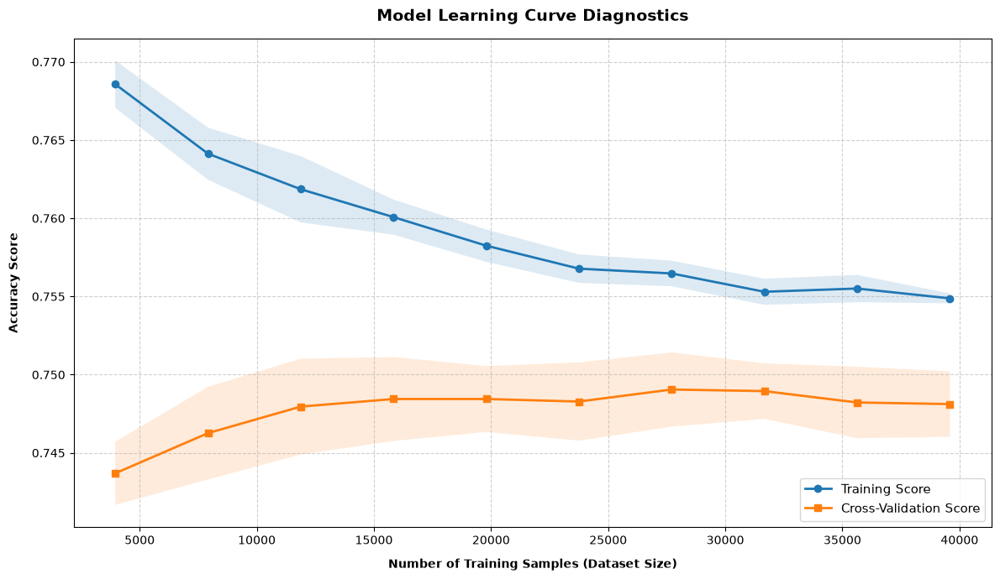

In [95]:
from sklearn.model_selection import learning_curve

# 1. Configure the learning curve parameters
# Using 5-fold cross-validation and testing 10 progressive steps of dataset size
train_sizes, train_scores, test_scores = learning_curve(
    xgb_optimized1,               
    x_train1,               
    y_train1,                     
    cv=5,                        
    scoring='accuracy',          
    n_jobs=-1,                   
    train_sizes=np.linspace(0.1, 1.0, 10)
)

# 2. Calculate the mathematical means and standard deviations across folds
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# 3. Construct the diagnostic dashboard
plt.figure(figsize=(12, 7))

# Plot the primary score trajectories
plt.plot(train_sizes, train_mean, 'o-', linewidth=2, label="Training Score")
plt.plot(train_sizes, test_mean, 's-', linewidth=2, label="Cross-Validation Score")

# Add the shaded variance clouds (crucial for evaluating stability)
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.15)
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.15)

# Layout adjustments for publication-ready styling
plt.title("Model Learning Curve Diagnostics", fontsize=14, fontweight='bold', pad=15)
plt.xlabel("Number of Training Samples (Dataset Size)", fontweight='bold', labelpad=10)
plt.ylabel("Accuracy Score", fontweight='bold', labelpad=10)
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(loc="lower right", fontsize=11)

plt.tight_layout()
plt.show()

This is a perfect representation what happens. Initially the model performs bad since it has little subset of data, then as training samples increase so does the accuracy up until 15.000 records, and from therre it flattens out. Adding more records does not improve the models accuracy. I have hit the ceiling with this dataset. 

In [96]:
df

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,3.0,5.0,30.0,0.0,1.0,4.0,6.0,8.0
1,0.0,1.0,1.0,1.0,26.0,1.0,1.0,0.0,0.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,1.0,12.0,6.0,8.0
2,0.0,0.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,10.0,0.0,1.0,13.0,6.0,8.0
3,0.0,1.0,1.0,1.0,28.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,3.0,0.0,1.0,11.0,6.0,8.0
4,0.0,0.0,0.0,1.0,29.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,8.0,5.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70687,1.0,0.0,1.0,1.0,37.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,4.0,0.0,0.0,0.0,0.0,6.0,4.0,1.0
70688,1.0,0.0,1.0,1.0,29.0,1.0,0.0,1.0,0.0,1.0,...,1.0,0.0,2.0,0.0,0.0,1.0,1.0,10.0,3.0,6.0
70689,1.0,1.0,1.0,1.0,25.0,0.0,0.0,1.0,0.0,1.0,...,1.0,0.0,5.0,15.0,0.0,1.0,0.0,13.0,6.0,4.0
70690,1.0,1.0,1.0,1.0,18.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,4.0,0.0,0.0,1.0,0.0,11.0,2.0,4.0


### Important note
One important thing I completely forgot when optimizing the model and it is crucial for real life application. Cross validation. This elinimates the risk of overfitting by training on a subset and testing on the holdout set. Repeted it with k many folds. I overlooked this part, so after feature engineering new columns I will utilize k fold cross validation during optimization.

## 6. Feature engineering and Threshold tuning

### Feature creation

In [97]:
dn

,GenHlth,Age,HighBP,HighChol,Sex,Income,HeartDiseaseorAttack,DiffWalk,Education,MentHlth,PhysHlth,Diabetes_binary,BMI_log
0,3.0,4.0,1.0,0.0,1.0,8.0,0.0,0.0,6.0,1,1,0.0,3.258097
1,3.0,12.0,1.0,1.0,1.0,8.0,0.0,0.0,6.0,0,0,0.0,3.258097
2,1.0,13.0,0.0,0.0,1.0,8.0,0.0,0.0,6.0,0,1,0.0,3.258097
3,3.0,11.0,1.0,1.0,1.0,8.0,0.0,0.0,6.0,0,1,0.0,3.332205
4,2.0,8.0,0.0,0.0,0.0,8.0,0.0,0.0,5.0,0,0,0.0,3.367296
...,...,...,...,...,...,...,...,...,...,...,...,...,...
70687,4.0,6.0,0.0,1.0,0.0,1.0,0.0,0.0,4.0,0,0,1.0,3.610918
70688,2.0,10.0,0.0,1.0,1.0,6.0,1.0,1.0,3.0,0,0,1.0,3.367296
70689,5.0,13.0,1.0,1.0,0.0,4.0,1.0,1.0,6.0,1,0,1.0,3.218876
70690,4.0,11.0,1.0,1.0,0.0,4.0,0.0,1.0,2.0,0,0,1.0,2.890372


To engineer new feautures from this dataset I can only use columns that are not binary, since XGB can already make combineded decisions with binaries.

So the usable features are:
- GenHlth
- Age
- Income
- Education
- BMI_log

To create feautures I can multiply, divide or raise them to powers.

In [98]:
from sklearn.preprocessing import PolynomialFeatures

cols_to_combine = ["GenHlth", "Age", "Income", "Education", "BMI_log"]
df_subset = dn[cols_to_combine]

# degree=2: Multiply a maximum of 2 columns together at a time
# interaction_only=True: Creates A*B, but prevents it from creating A^2 or B^2
# include_bias=False: Prevents it from adding a useless column of 1s
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)

# 3. Perform the math
poly_array = poly.fit_transform(df_subset)


new_col_names = poly.get_feature_names_out(cols_to_combine)

df_interactions = pd.DataFrame(poly_array, columns=new_col_names, index=dn.index)

df_interactions = df_interactions.drop(columns=cols_to_combine)
df_interactions

,GenHlth Age,GenHlth Income,GenHlth Education,GenHlth BMI_log,Age Income,Age Education,Age BMI_log,Income Education,Income BMI_log,Education BMI_log
0,12.0,24.0,18.0,9.774290,32.0,24.0,13.032386,48.0,26.064772,19.548579
1,36.0,24.0,18.0,9.774290,96.0,72.0,39.097158,48.0,26.064772,19.548579
2,13.0,8.0,6.0,3.258097,104.0,78.0,42.355255,48.0,26.064772,19.548579
3,33.0,24.0,18.0,9.996614,88.0,66.0,36.654250,48.0,26.657636,19.993227
4,16.0,16.0,10.0,6.734592,64.0,40.0,26.938367,40.0,26.938367,16.836479
...,...,...,...,...,...,...,...,...,...,...
70687,24.0,4.0,16.0,14.443672,6.0,24.0,21.665507,4.0,3.610918,14.443672
70688,20.0,12.0,6.0,6.734592,60.0,30.0,33.672958,18.0,20.203775,10.101887
70689,65.0,20.0,30.0,16.094379,52.0,78.0,41.845386,24.0,12.875503,19.313255
70690,44.0,16.0,8.0,11.561487,44.0,22.0,31.794089,8.0,11.561487,5.780744


In [99]:
dn = pd.concat([dn, df_interactions], axis=1)

In [100]:
# ratios
dn["Age_div_Income"] = dn["Age"] / dn["Income"]
dn["Age_div_Education"] = dn["Age"] / dn["Education"]
dn["Age_div_GH"] = dn["Age"] / dn["GenHlth"]
dn["Age_div_BMI"] = dn["Age"] / dn["BMI_log"]

# 2. The Reciprocal Division (Risk scales DOWN as the number gets bigger)
dn["GH_div_Income"] = dn["GenHlth"] / dn["Income"]
dn["GH_div_Education"] = dn["GenHlth"] / dn["Education"]
dn["GH_div_BMI"] = dn["GenHlth"] / dn["BMI_log"]

# You can do this for any other combinations that make biological sense:
dn["Income_div_Education"] = dn["Income"] / dn["Education"]
dn["Income_div_BMI"] = dn["Income"] / dn["BMI_log"]

dn["Education_div_BMI"] = dn["Education"] / dn["BMI_log"]

In [101]:
x2 = dn.drop(columns=["Diabetes_binary"])
y2 = dn["Diabetes_binary"]

x_train2, x_test2, y_train2, y_test2 = train_test_split(x2, y2, stratify=y, random_state=11, test_size=0.3)

### Creating XGB model and tuning it

In [102]:
study_xgb4 = optuna.load_study(
    study_name="xgboost_v4", 
    storage="sqlite:///my_models.db"
)

In [103]:
study_xgb4 = optuna.create_study(
    study_name="xgboost_v4",  
    storage="sqlite:///my_models.db",  
    direction="maximize",              
    load_if_exists=True                
)

[I 2026-09-16 16:29:31,289] Using an existing study with name 'xgboost_v4' instead of creating a new one.


In [104]:
from sklearn.model_selection import cross_val_score, StratifiedKFold

In [105]:
def objective_xgb4(trial):
    # 1. Define the hyperparameter search space
    params = {
        'learning_rate': trial.suggest_float('learning_rate', 1e-3, 0.1, log=True),
        'max_depth': trial.suggest_int('max_depth', 3, 9),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-5, 1.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-5, 1.0, log=True),
        'n_estimators': trial.suggest_int("n_estimators", 50, 1200),

        
        'n_jobs': 1,       
        'random_state': 11,
        'objective': 'binary:logistic'
    }
    
    # 2. Instantiate the model
    model = xgb.XGBClassifier(**params)
    
    # 3. Configure Stratified 3-Fold CV
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=11)
    
    # 4. Calculate and return the mean score across all 5 folds
    scores = cross_val_score(model, x_train2, y_train2, cv=cv, scoring='accuracy', n_jobs=1)
    
    return scores.mean()

In [106]:
study_xgb4.optimize(objective_xgb4, n_trials=1, n_jobs=-1, show_progress_bar=True)

  0%|          | 0/1 [00:00<?, ?it/s]

[I 2026-09-16 16:29:50,371] Trial 1002 finished with value: 0.7492117088142061 and parameters: {'learning_rate': 0.012801625969581554, 'max_depth': 4, 'subsample': 0.5592980787992461, 'colsample_bytree': 0.8371018463392431, 'reg_alpha': 0.0002068618370521321, 'reg_lambda': 0.01640472570253663, 'n_estimators': 708}. Best is trial 593 with value: 0.7500604794459733.


In [107]:
plot_optimization_history(study_xgb4)

In [108]:
xgb_optimized4 = xgb.XGBClassifier(**study_xgb4.best_params, random_state=11)
xgb_optimized4

,"base_score base_score: typing.Union[float, typing.List[float], NoneType]The initial prediction score of all instances, global bias.",None
,booster,None
,"callbacks callbacks: typing.Optional[typing.List[xgboost.callback.TrainingCallback]]List of callback functions that are applied at end of each iteration.It is possible to use predefined callbacks by using:ref:`Callback API <callback_api>`... note:: States in callback are not preserved during training, which means callback objects can not be reused for multiple training sessions without reinitialization or deepcopy... code-block:: python for params in parameters_grid: # be sure to (re)initialize the callbacks before each run callbacks = [xgb.callback.LearningRateScheduler(custom_rates)] reg = xgboost.XGBRegressor(**params, callbacks=callbacks) reg.fit(X, y)",None
,colsample_bylevel colsample_bylevel: typing.Optional[float]Subsample ratio of columns for each level.,None
,colsample_bynode colsample_bynode: typing.Optional[float]Subsample ratio of columns for each split.,None
,colsample_bytree colsample_bytree: typing.Optional[float]Subsample ratio of columns when constructing each tree.,0.8241910986783259
,"device device: typing.Optional[str].. versionadded:: 2.0.0Device ordinal, available options are `cpu`, `cuda`, and `gpu`.",None
,"early_stopping_rounds early_stopping_rounds: typing.Optional[int].. versionadded:: 1.6.0- Activates early stopping. Validation metric needs to improve at least once in every **early_stopping_rounds** round(s) to continue training. Requires at least one item in **eval_set** in :py:meth:`fit`.- If early stopping occurs, the model will have two additional attributes: :py:attr:`best_score` and :py:attr:`best_iteration`. These are used by the :py:meth:`predict` and :py:meth:`apply` methods to determine the optimal number of trees during inference. If users want to access the full model (including trees built after early stopping), they can specify the `iteration_range` in these inference methods. In addition, other utilities like model plotting can also use the entire model.- If you prefer to discard the trees after `best_iteration`, consider using the callback function :py:class:`xgboost.callback.EarlyStopping`.- If there's more than one item in **eval_set**, the last entry will be used for early stopping. If there's more than one metric in **eval_metric**, the last metric will be used for early stopping.",None
,enable_categorical enable_categorical: boolSee the same parameter of :py:class:`DMatrix` for details.,False
,"eval_metric eval_metric: typing.Union[str, typing.List[typing.Union[str, typing.Callable]], typing.Callable, NoneType].. versionadded:: 1.6.0Metric used for monitoring the training result and early stopping. It can be astring or list of strings as names of predefined metric in XGBoost (See:doc:`/parameter`), one of the metrics in :py:mod:`sklearn.metrics`, or anyother user defined metric that looks like `sklearn.metrics`.If custom objective is also provided, then custom metric should implement thecorresponding reverse link function.Unlike the `scoring` parameter commonly used in scikit-learn, when a callableobject is provided, it's assumed to be a cost function and by default XGBoostwill minimize the result during early stopping.For advanced usage on Early stopping like directly choosing to maximize insteadof minimize, see :py:obj:`xgboost.callback.EarlyStopping`.See :doc:`/tutorials/custom_metric_obj` and :ref:`custom-obj-metric` for moreinformation... code-block:: python from sklearn.datasets import load_diabetes from sklearn.metrics import mean_absolute_error X, y = load_diabetes(return_X_y=True) reg = xgb.XGBRegressor( tree_method=""hist"", eval_metric=mean_absolute_error, ) reg.fit(X, y, eval_set=[(X, y)])",None
,feature_types feature_types: typing.Optional[typing.Sequence[str]].. versionadded:: 1.7.0Used for specifying feature types without constructing a dataframe. Seethe :py:class:`DMatrix` for details.,None


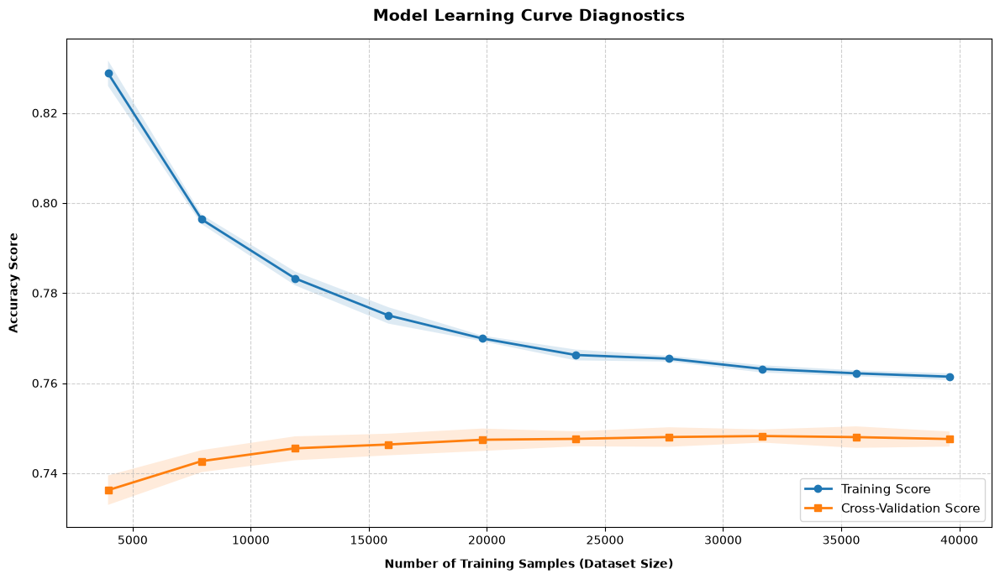

In [109]:
train_sizes, train_scores, test_scores = learning_curve(
    xgb_optimized4,               
    x_train2,               
    y_train2,                     
    cv=5,                        
    scoring='accuracy',          
    n_jobs=-1,                   
    train_sizes=np.linspace(0.1, 1.0, 10)
)

# 2. Calculate the mathematical means and standard deviations across folds
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# 3. Construct the diagnostic dashboard
plt.figure(figsize=(12, 7))

# Plot the primary score trajectories
plt.plot(train_sizes, train_mean, 'o-', linewidth=2, label="Training Score")
plt.plot(train_sizes, test_mean, 's-', linewidth=2, label="Cross-Validation Score")

# Add the shaded variance clouds (crucial for evaluating stability)
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.15)
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.15)

# Layout adjustments for publication-ready styling
plt.title("Model Learning Curve Diagnostics", fontsize=14, fontweight='bold', pad=15)
plt.xlabel("Number of Training Samples (Dataset Size)", fontweight='bold', labelpad=10)
plt.ylabel("Accuracy Score", fontweight='bold', labelpad=10)
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(loc="lower right", fontsize=11)

plt.tight_layout()
plt.show()

### Improvement to baseline features
Did the modell improve by generating new feature combination? Lets check the last optimization.

In [110]:
study_xgb3 = optuna.create_study(
    study_name="xgboost_v3",  
    storage="sqlite:///my_models.db",  
    direction="maximize",              
    load_if_exists=True                
)

[I 2026-09-16 16:30:25,754] Using an existing study with name 'xgboost_v3' instead of creating a new one.


In [111]:
def objective_xgb3(trial):
    # 1. Define the hyperparameter search space
    params = {
        'learning_rate': trial.suggest_float('learning_rate', 1e-3, 0.1, log=True),
        'max_depth': trial.suggest_int('max_depth', 3, 9),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-5, 1.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-5, 1.0, log=True),
        'n_estimators': trial.suggest_int("n_estimators", 50, 1200),

        
        'n_jobs': 1,       
        'random_state': 11,
        'objective': 'binary:logistic'
    }
    
    # 2. Instantiate the model
    model = xgb.XGBClassifier(**params)
    
    # 3. Configure Stratified 3-Fold CV
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=11)
    
    # 4. Calculate and return the mean score across all 5 folds
    scores = cross_val_score(model, x_train1, y_train1, cv=cv, scoring='accuracy', n_jobs=1)
    
    return scores.mean()

In [112]:
study_xgb3.optimize(objective_xgb3, n_trials=1, n_jobs=-1)

[I 2026-09-16 16:30:44,388] Trial 1020 finished with value: 0.7498381878212198 and parameters: {'learning_rate': 0.011139236237717093, 'max_depth': 5, 'subsample': 0.7918758188364002, 'colsample_bytree': 0.5080932883133722, 'reg_alpha': 6.477656265702391e-05, 'reg_lambda': 0.2676392859652381, 'n_estimators': 1168}. Best is trial 844 with value: 0.7504242321620043.


In [113]:
plot_optimization_history(study_xgb3)

In [114]:
xgb_final = xgb.XGBClassifier(**study_xgb3.best_params, random_state=11)
xgb_final

,"base_score base_score: typing.Union[float, typing.List[float], NoneType]The initial prediction score of all instances, global bias.",None
,booster,None
,"callbacks callbacks: typing.Optional[typing.List[xgboost.callback.TrainingCallback]]List of callback functions that are applied at end of each iteration.It is possible to use predefined callbacks by using:ref:`Callback API <callback_api>`... note:: States in callback are not preserved during training, which means callback objects can not be reused for multiple training sessions without reinitialization or deepcopy... code-block:: python for params in parameters_grid: # be sure to (re)initialize the callbacks before each run callbacks = [xgb.callback.LearningRateScheduler(custom_rates)] reg = xgboost.XGBRegressor(**params, callbacks=callbacks) reg.fit(X, y)",None
,colsample_bylevel colsample_bylevel: typing.Optional[float]Subsample ratio of columns for each level.,None
,colsample_bynode colsample_bynode: typing.Optional[float]Subsample ratio of columns for each split.,None
,colsample_bytree colsample_bytree: typing.Optional[float]Subsample ratio of columns when constructing each tree.,0.5744472445897163
,"device device: typing.Optional[str].. versionadded:: 2.0.0Device ordinal, available options are `cpu`, `cuda`, and `gpu`.",None
,"early_stopping_rounds early_stopping_rounds: typing.Optional[int].. versionadded:: 1.6.0- Activates early stopping. Validation metric needs to improve at least once in every **early_stopping_rounds** round(s) to continue training. Requires at least one item in **eval_set** in :py:meth:`fit`.- If early stopping occurs, the model will have two additional attributes: :py:attr:`best_score` and :py:attr:`best_iteration`. These are used by the :py:meth:`predict` and :py:meth:`apply` methods to determine the optimal number of trees during inference. If users want to access the full model (including trees built after early stopping), they can specify the `iteration_range` in these inference methods. In addition, other utilities like model plotting can also use the entire model.- If you prefer to discard the trees after `best_iteration`, consider using the callback function :py:class:`xgboost.callback.EarlyStopping`.- If there's more than one item in **eval_set**, the last entry will be used for early stopping. If there's more than one metric in **eval_metric**, the last metric will be used for early stopping.",None
,enable_categorical enable_categorical: boolSee the same parameter of :py:class:`DMatrix` for details.,False
,"eval_metric eval_metric: typing.Union[str, typing.List[typing.Union[str, typing.Callable]], typing.Callable, NoneType].. versionadded:: 1.6.0Metric used for monitoring the training result and early stopping. It can be astring or list of strings as names of predefined metric in XGBoost (See:doc:`/parameter`), one of the metrics in :py:mod:`sklearn.metrics`, or anyother user defined metric that looks like `sklearn.metrics`.If custom objective is also provided, then custom metric should implement thecorresponding reverse link function.Unlike the `scoring` parameter commonly used in scikit-learn, when a callableobject is provided, it's assumed to be a cost function and by default XGBoostwill minimize the result during early stopping.For advanced usage on Early stopping like directly choosing to maximize insteadof minimize, see :py:obj:`xgboost.callback.EarlyStopping`.See :doc:`/tutorials/custom_metric_obj` and :ref:`custom-obj-metric` for moreinformation... code-block:: python from sklearn.datasets import load_diabetes from sklearn.metrics import mean_absolute_error X, y = load_diabetes(return_X_y=True) reg = xgb.XGBRegressor( tree_method=""hist"", eval_metric=mean_absolute_error, ) reg.fit(X, y, eval_set=[(X, y)])",None
,feature_types feature_types: typing.Optional[typing.Sequence[str]].. versionadded:: 1.7.0Used for specifying feature types without constructing a dataframe. Seethe :py:class:`DMatrix` for details.,None


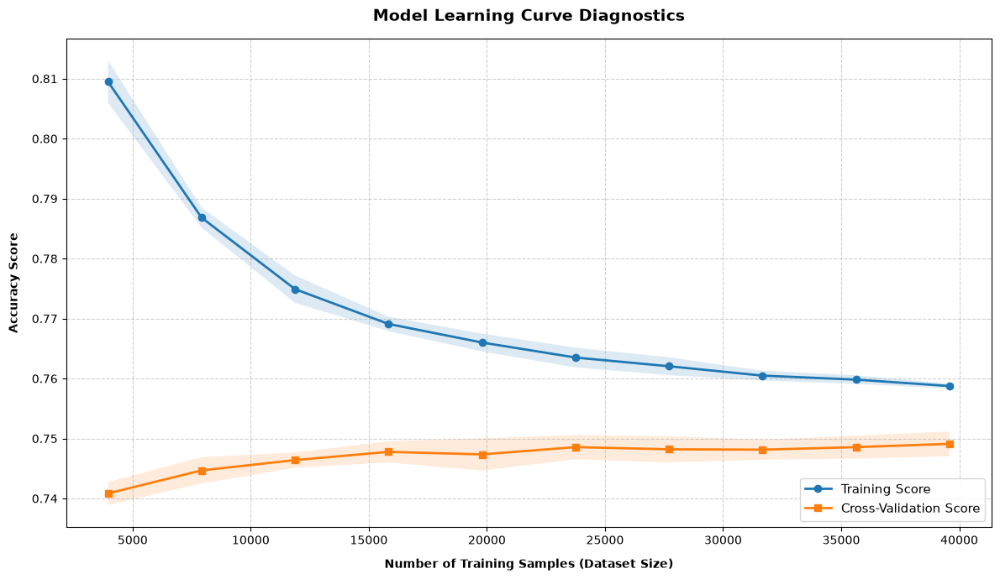

In [115]:
train_sizes, train_scores, test_scores = learning_curve(
    xgb_final,               
    x_train1,               
    y_train1,                     
    cv=5,                        
    scoring='accuracy',          
    n_jobs=-1,                   
    train_sizes=np.linspace(0.1, 1.0, 10)
)

# 2. Calculate the mathematical means and standard deviations across folds
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# 3. Construct the diagnostic dashboard
plt.figure(figsize=(12, 7))

# Plot the primary score trajectories
plt.plot(train_sizes, train_mean, 'o-', linewidth=2, label="Training Score")
plt.plot(train_sizes, test_mean, 's-', linewidth=2, label="Cross-Validation Score")

# Add the shaded variance clouds (crucial for evaluating stability)
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.15)
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.15)

# Layout adjustments for publication-ready styling
plt.title("Model Learning Curve Diagnostics", fontsize=14, fontweight='bold', pad=15)
plt.xlabel("Number of Training Samples (Dataset Size)", fontweight='bold', labelpad=10)
plt.ylabel("Accuracy Score", fontweight='bold', labelpad=10)
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(loc="lower right", fontsize=11)

plt.tight_layout()
plt.show()

As it turns out v3 outperforms v4 ever so slightly. The difference is quite small. This means that generated features did not help to overcome the 75% accuracy border. So I would just keep the v3 as the final model with less features. It runs each predictions faster, and the survey needs less question to accuractly predict a patient outcome.

### Threshold tuning with final model

In [116]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score

xgb_final.fit(x_train1, y_train1)
y_probs = xgb_final.predict_proba(x_train1)[:, 1]

# 2. Sweep across thresholds from 0.1 to 0.9
thresholds = np.arange(0.1, 0.95, 0.05)
tuning_records = []

for thresh in thresholds:
    y_pred_custom = (y_probs >= thresh).astype(int)
    
    # Calculate confusion matrix elements
    tn, fp, fn, tp = confusion_matrix(y_train1, y_pred_custom).ravel()
    
    tuning_records.append({
        'Threshold': round(thresh, 2),
        'True Positives (Caught)': tp,
        'False Positives (Alarms)': fp,
        'False Negatives (Missed)': fn,
        'Precision': round(precision_score(y_train1, y_pred_custom, zero_division=0), 3),
        'Recall (Sensitivity)': round(recall_score(y_train1, y_pred_custom, zero_division=0), 3),
        'F1-Score': round(f1_score(y_train1, y_pred_custom, zero_division=0), 3),
        "Accuracy" : round(accuracy_score(y_train1, y_pred_custom), 3)
    })

# 3. Render the menu
tuning_df = pd.DataFrame(tuning_records)
tuning_df

,Threshold,True Positives (Caught),False Positives (Alarms),False Negatives (Missed),Precision,Recall (Sensitivity),F1-Score,Accuracy
0,0.10,24496,18290,246,0.573,0.990,0.726,0.625
1,0.15,24209,16239,533,0.599,0.978,0.743,0.661
2,0.20,23867,14565,875,0.621,0.965,0.756,0.688
3,0.25,23471,13139,1271,0.641,0.949,0.765,0.709
4,0.30,23003,11802,1739,0.661,0.930,0.773,0.726
5,0.35,22422,10531,2320,0.680,0.906,0.777,0.740
6,0.40,21703,9337,3039,0.699,0.877,0.778,0.750
7,0.45,20839,8207,3903,0.717,0.842,0.775,0.755
8,0.50,19812,7109,4930,0.736,0.801,0.767,0.757
9,0.55,18623,5998,6119,0.756,0.753,0.755,0.755


From the table above I can see the final model at the outputs at different threshold. Based on the cost of each class I could advice a threshold that meets hospitals needs. For example if the missing a diabetic person is very costly, we try to catch all of them, so I recommend a lower threshold at 35 or 40%. If missing the true positives are not that expensive but alerting false positives then I would raise the threshold to be very precise with predictions. It is a tradeoff, as it is visible in the table as threshold increases so does the precision, every prediction has a higher chance being accurate. On the other hand the recall drops. The model will identify much less of those class.

## 7. Saving model, answering questions.

In [117]:
# save the model for deployment
filename = 'xgb_diabetes_model_final_12features.joblib'

# 2. Freeze and save the model to your hard drive
joblib.dump(xgb_final, filename)

['xgb_diabetes_model_final_12features.joblib']

1. Can survey questions from the BRFSS provide accurate predictions of whether an individual has diabetes?

    It depends on what do we define as accurate, if a patients fate would only depend on this model then I would say no, an accuracy of 75% is not the best to solely depend on this model. I would need more information so I could train the model to be more accurate. (Diagnosis)

    On the other hand if the model was used as a first-layer filter then, I would say that a 75% accuracy is quite good in healthcare sector, regarding the fact that it was trained on just simple healtcare and sociological features. (Screening)



2. What risk factors are most predictive of diabetes risk?

    According to multiple expalantory tools like inforation theory, permutation importance, SHAP and model`s internal importances the most predictive factors are GenHlth, HighBP, BMI, Age and HighChol


3. Can we use a subset of the risk factors to accurately predict whether an individual has diabetes?

    Yes, keeping the above mentioned features and 6 more I was able to keep the accuracy the same. The rest of the features were noise for the models.

4. Can we create a short form of questions from the BRFSS using feature selection to accurately predict if someone might have diabetes or is at high risk of diabetes?

    Yes, focusing only on GenHlth, HighBP, BMI, Age and HighChol and 6 more the predictions can be created with the same accuracy with a smaller questionnaire.

## 8. Self reflection

In my eyes I improved a lot by working on this dataset. I started off with the general explanatory analysis and luckily I did not have to spend much time cleaning data and setting up features for test. I got a clean dataset from the start to work with. Then in the model training phase I quickly realized that SVC will not suit me with this dataset as it is slow to train. So I stuck with Logistic Regression and XGB.I did multiple rounds of training and optimizing, trying out new hyphotehsis to test. I made some minor mistakes during training where I completely forgot the use of cross-validation. This simple process is responsible for the model to well generalize its rule and be ready to the real life deployment. 

All in all, I saw that there are around 5 features whose importances matter the most. Even though I tried multiple methods for feature engineering I could not achieve a higher result than ~75%. This indicates me that I have reached the irreducible border and without newer information about a patient (like blood type, insulin level) I can not train a better model. 

I was able to answer the question which were stated at the very beggining of this project with a high confidence. I had a great time working on this dataset and now I am able to work with machine learning models to tackle classification problems whether it is healthcare, banking or weather data.